## Conexión con drive
En este paso conectamos con drive donde está alojado el conjunto de datos que vamos a utilizar para nuestros entrenamientos y para construir y desarollar nuestros modelos.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importamos las librerías

In [ ]:
# Listamos todas las librerías instaladas en nuestro entorno.
# !python3 -m pip list

In [2]:
# Importamos todas las librerías necesarias
# ==============================================================================
import numpy as np  # Módulo para utilizar operaciones matemáticas
import pandas as pd  # Librería para manejar datos en formato dataframe
import matplotlib as mpl  # Librería de gráficos
from matplotlib import pyplot as plt  # Librería de gráficos
import seaborn as sns  # Librería de gráficos
sns.set()  # Establecemos el estilo de la librería seaborn
import tensorflow as tf
from tensorflow import keras

from sklearn.model_selection import train_test_split  # Importar función para dividir el conjunto de datos en entrenamiento y prueba
from sklearn.metrics import classification_report, confusion_matrix  # Importar métricas para evaluar el rendimiento del modelo
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score  # Importar métricas adicionales para evaluar el rendimiento del modelo
from sklearn.model_selection import RandomizedSearchCV  # Importar módulos para búsqueda aleatoria de hiperparámetros
from sklearn.model_selection import train_test_split  # Importar función para dividir el conjunto de datos en entrenamiento y prueba
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier  # Importar clasificador de Keras compatible con scikit-learn

import cv2  # Biblioteca para procesamiento de imágenes
import os  # Módulo para interactuar con el sistema operativo
from pathlib import Path  # Módulo para manipular rutas de archivos y directorios
import random  # Módulo para generar números aleatorios

# Configuración para mostrar gráficos en línea en el entorno de Jupyter Notebook
%matplotlib inline

print(tf.__version__)  # Imprimir la versión de TensorFlow utilizada en el proyecto

2.12.0


## Configuramos GPU como unidad de computación

In [2]:
tf.compat.v1.disable_eager_execution()  # Deshabilitar ejecución en TensorFlow v1

with tf.device('/gpu:0'):  # Especificar el uso de la GPU en el dispositivo '/gpu:0'
    a = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[2, 3], name='a')  # Crear un tensor constante 'a'
    b = tf.constant([1.0, 2.0, 3.0, 4.0, 5.0, 6.0], shape=[3, 2], name='b')  # Crear un tensor constante 'b'
    c = tf.matmul(a, b)  # Realizar una multiplicación de matrices 'a' y 'b'

with tf.compat.v1.Session() as sess:  # Crear una sesión de TensorFlow
    print(sess.run(c))  # Ejecutar la sesión y calcular el resultado de 'c'

print("Num GPUs Available: ", len(tf.config.list_physical_devices()))  # Imprimir el número de GPUs disponibles
# os.environ["CUDA_VISIBLE_DEVICES"]="0"

print(tf.config.list_physical_devices())  # Imprimir la lista de dispositivos físicos disponibles

print(tf.config.list_physical_devices('GPU'))  # Imprimir la lista de dispositivos físicos de tipo GPU disponibles

sess = tf.compat.v1.Session()  # Crear una nueva sesión de TensorFlow
print(sess.list_devices())  # Imprimir la lista de dispositivos en la sesión

print(tf.test.is_built_with_cuda())  # Comprobar si TensorFlow está construido con soporte CUDA

[[22. 28.]
 [49. 64.]]
Num GPUs Available:  2
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[_DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 268435456, -2321564585586186428), _DeviceAttributes(/job:localhost/replica:0/task:0/device:GPU:0, GPU, 14328594432, 6307914601257113010)]
True


# Estudio y desarrollo de modelos de aprendizaje profundo aplicados al diagnóstico de enfermedades oculares

## Índice del proyecto
1. Análisis descriptivo
2. Preprocesado de datos
3. Creación de métodos para modelado
4. Ejecución de modelos para cada caso de estudio


### 1. Análisis descriptivo

In [3]:
#################
# Carga y transformación del DataFrame df2
#################

df2 = pd.read_csv('/content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/full_df.csv')  # Carga el archivo CSV en un DataFrame
df2 = df2.rename(columns=lambda x: x.replace("-", "_").replace(" ", "_").lower())  # Renombra las columnas reemplazando guiones y espacios por guiones bajos y convirtiéndolas a minúsculas

df2 = df2.rename(columns = {'n': 'normal',
                            'd': 'diabetes',
                            'g': 'glaucoma',
                            'c': 'cataract',
                            'a': 'age_related_macular_degeneration',
                            'h': 'hypertension',
                            'm': 'pathological_myopia',
                            'o': 'other_diseases'})  # Renombra las columnas específicas según un diccionario de mapeo

df2 = pd.concat([df2, pd.get_dummies(df2["target"], prefix="target")], axis = 1)  # Crea columnas de variables ficticias (one-hot encoding) para la columna "target" y las concatena al DataFrame
df2 = df2.rename(columns = {'target_[1, 0, 0, 0, 0, 0, 0, 0]': 'target_normal',
                            'target_[0, 1, 0, 0, 0, 0, 0, 0]': 'target_diabetes',
                            'target_[0, 0, 1, 0, 0, 0, 0, 0]': 'target_glaucoma',
                            'target_[0, 0, 0, 1, 0, 0, 0, 0]': 'target_cataract',
                            'target_[0, 0, 0, 0, 1, 0, 0, 0]': 'target_age_related_macular_degeneration',
                            'target_[0, 0, 0, 0, 0, 1, 0, 0]': 'target_hypertension',
                            'target_[0, 0, 0, 0, 0, 0, 1, 0]': 'target_pathological_myopia',
                            'target_[0, 0, 0, 0, 0, 0, 0, 1]': 'target_other_diseases'})  # Renombra las columnas específicas según un diccionario de mapeo

df2.head()  # Muestra las primeras filas del DataFrame

,id,patient_age,patient_sex,left_fundus,right_fundus,left_diagnostic_keywords,right_diagnostic_keywords,normal,diabetes,glaucoma,...,target,filename,target_other_diseases,target_pathological_myopia,target_hypertension,target_age_related_macular_degeneration,target_cataract,target_glaucoma,target_diabetes,target_normal
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,...,"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg,0,0,0,0,0,0,0,1
1,1,57,Male,1_left.jpg,1_right.jpg,normal fundus,normal fundus,1,0,0,...,"[1, 0, 0, 0, 0, 0, 0, 0]",1_right.jpg,0,0,0,0,0,0,0,1
2,2,42,Male,2_left.jpg,2_right.jpg,laser spot，moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,...,"[0, 1, 0, 0, 0, 0, 0, 0]",2_right.jpg,0,0,0,0,0,0,1,0
3,4,53,Male,4_left.jpg,4_right.jpg,macular epiretinal membrane,mild nonproliferative retinopathy,0,1,0,...,"[0, 1, 0, 0, 0, 0, 0, 0]",4_right.jpg,0,0,0,0,0,0,1,0
4,5,50,Female,5_left.jpg,5_right.jpg,moderate non proliferative retinopathy,moderate non proliferative retinopathy,0,1,0,...,"[0, 1, 0, 0, 0, 0, 0, 0]",5_right.jpg,0,0,0,0,0,0,1,0


In [4]:
#################
# Estudiamos los valores nulos
#################
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6392 entries, 0 to 6391
Data columns (total 27 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   id                                       6392 non-null   int64 
 1   patient_age                              6392 non-null   int64 
 2   patient_sex                              6392 non-null   object
 3   left_fundus                              6392 non-null   object
 4   right_fundus                             6392 non-null   object
 5   left_diagnostic_keywords                 6392 non-null   object
 6   right_diagnostic_keywords                6392 non-null   object
 7   normal                                   6392 non-null   int64 
 8   diabetes                                 6392 non-null   int64 
 9   glaucoma                                 6392 non-null   int64 
 10  cataract                                 6392 non-null   int

In [5]:
#################
# Estudiamos los valores estadísticos como medias, modas y máximos para las variables
# continuas, así como valores únicos y valor más repetido para las variables categóricas
#################

df2.describe(include = "all")

,id,patient_age,patient_sex,left_fundus,right_fundus,left_diagnostic_keywords,right_diagnostic_keywords,normal,diabetes,glaucoma,...,target,filename,target_other_diseases,target_pathological_myopia,target_hypertension,target_age_related_macular_degeneration,target_cataract,target_glaucoma,target_diabetes,target_normal
count,6392.000000,6392.000000,6392,6392,6392,6392,6392,6392.000000,6392.000000,6392.000000,...,6392,6392,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000,6392.000000
unique,NaN,NaN,2,3358,3358,196,205,NaN,NaN,NaN,...,8,6392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Male,0_left.jpg,0_right.jpg,normal fundus,normal fundus,NaN,NaN,NaN,...,"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,3424,2,2,2796,2705,NaN,NaN,NaN,...,2873,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2271.150814,57.857947,NaN,NaN,NaN,NaN,NaN,0.328692,0.332134,0.062109,...,NaN,NaN,0.110763,0.036295,0.020025,0.041615,0.045839,0.044431,0.251564,0.449468
std,1417.559018,11.727737,NaN,NaN,NaN,NaN,NaN,0.469775,0.471016,0.241372,...,NaN,NaN,0.313864,0.187039,0.140097,0.199722,0.209151,0.206066,0.433946,0.497479
min,0.000000,1.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,...,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,920.750000,51.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,...,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2419.500000,59.000000,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,...,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3294.000000,66.000000,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,0.000000,...,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000


Las conclusiones que podemos sacar en este breve estudio serían la media de edad, edad mínima y máxima del paciente. Podemos ver a grandes rasgos cuales son las enfermedades más frecuentes fijándonos en las medias más altas (sin contar N (normal), serían Diabetes y Otras enfermedades no catalogadas)

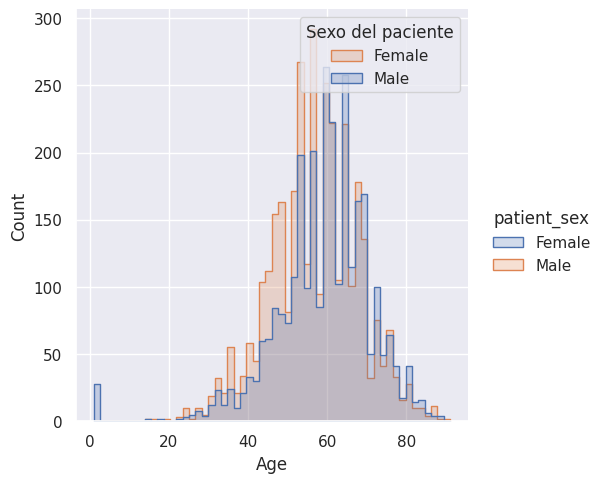

In [ ]:
#########Quitar código##############

#################
# Este código crea un gráfico de distribución (displot) utilizando la librería seaborn.
# La función sns.displot() recibe como argumentos el DataFrame df2, la columna "patient_age" para el eje x, la opción "step" para el elemento visual y la columna "patient_sex" para el atributo hue, y se especifica legend=True para mostrar la leyenda en el gráfico resultante.
#################

# Create the displot with axis and hue names
displot = sns.displot(df2, x="patient_age", element="step", hue="patient_sex", legend =True)

plt.legend(title='Sexo del paciente', labels = df2["patient_sex"].unique())
# Set axis and hue names
displot.set(xlabel="Age", ylabel="Frecuencia " )

# Show the plot
plt.show()

In [ ]:
#################
# Este código define una función llamada grouped_histogram_plots que crea subplots de histogramas agrupados.
#################

def grouped_histogram_plots(df, cols=[], title=""):
    df_ = df[cols].copy()  # Crear una copia del DataFrame con las columnas especificadas
    fig, ax = plt.subplots(figsize=(12, 6))  # Crear una figura con 8 subplots en una cuadrícula de 2x4

    ax.hist(df_.values, bins=2, range=[-0.5, 1.5], label=cols, edgecolor='black')  # Graficar histogramas en cada subplot

    ax.set_title(title)  # Establecer el título del gráfico
    ax.set_xlabel('Valor asignado a la categoría')  # Establecer etiqueta del eje x
    ax.set_ylabel('Frecuencia')  # Establecer etiqueta del eje y

    ax.set_xticks([0, 1])  # Establecer las marcas en el eje x
    ax.set_xticklabels(['0', '1'])  # Establecer las etiquetas en el eje x

    ax.legend()  # Agregar una leyenda al gráfico

    plt.show()  # Mostrar el gráfico


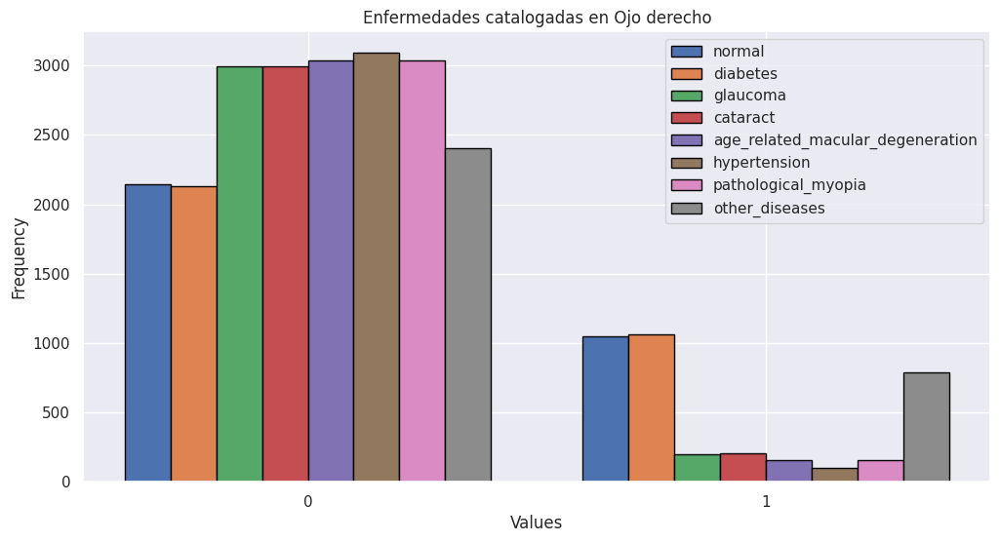

In [ ]:
grouped_histogram_plots(df_right_eye, cols = df_right_eye.columns[7:15], title="Enfermedades catalogadas en Ojo derecho")

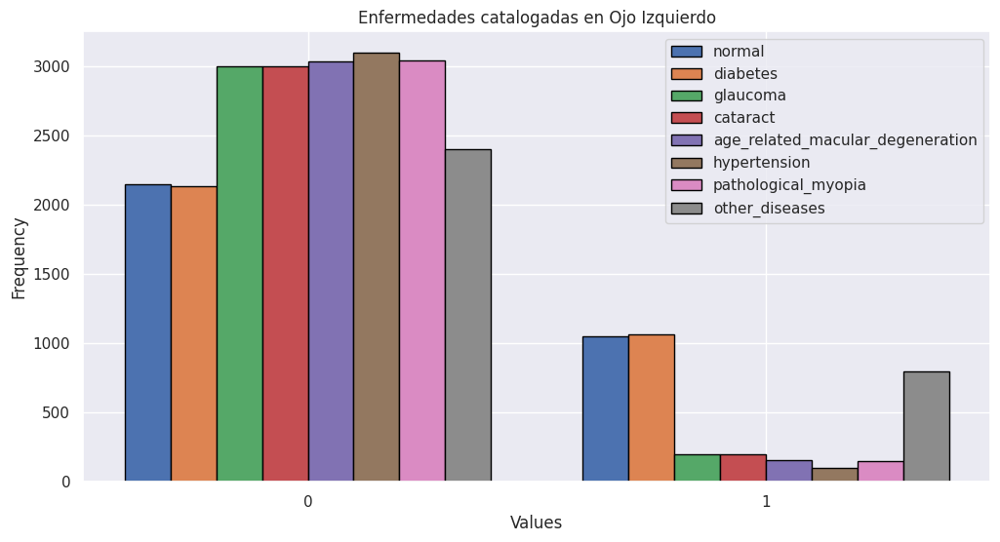

In [ ]:
grouped_histogram_plots(df_left_eye, cols = df_left_eye.columns[7:15], title="Enfermedades catalogadas en Ojo Izquierdo")

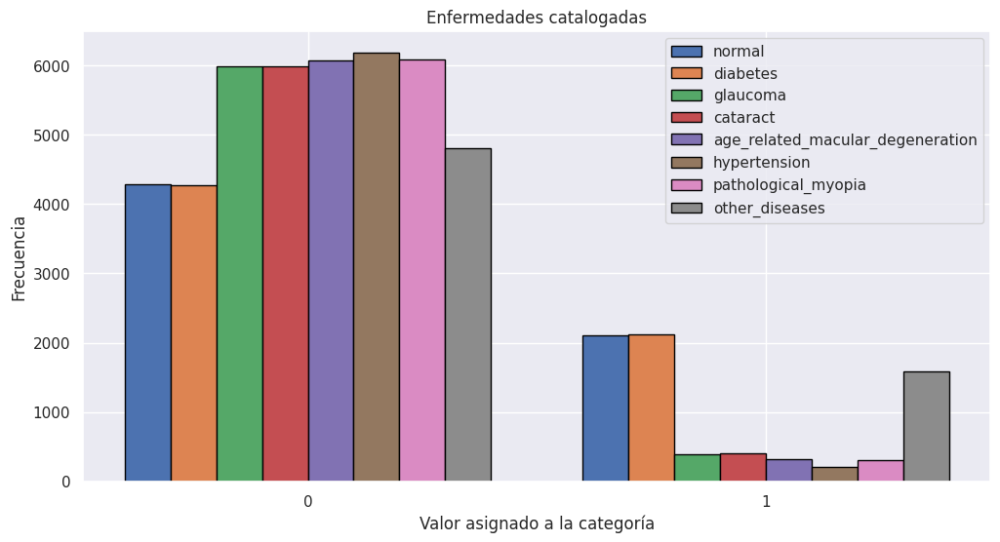

In [ ]:
grouped_histogram_plots(df2, cols = df2.columns[7:15], title="Enfermedades catalogadas")

Tras observar los gráficos anterioes podemos observar las enfermedades más frecuentes, siendo la diabetes la principal enfermedad diagnosticada, seguida del resto de enfermedades, que están al mismo nivel, y sin contar a aquellas enfermedades que no están catalogadas.

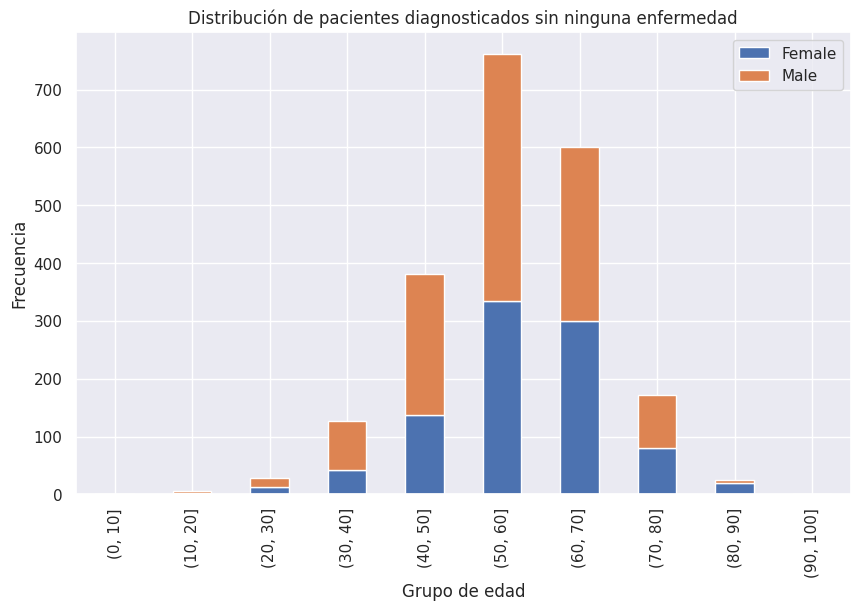

In [7]:
#################
# Este código realiza un análisis de la distribución de pacientes diagnosticados sin ninguna enfermedad en diferentes grupos de edad y sexo.
#################

df2['age_group'] = pd.cut(df2['patient_age'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])  # Crear una columna 'age_group' en el DataFrame utilizando pd.cut() para agrupar las edades en intervalos
age_counts = df2[df2['normal'] == 1].groupby(['age_group', 'patient_sex']).size().unstack()  # Calcular el recuento de pacientes por grupo de edad y sexo utilizando groupby(), size() y unstack()

age_counts.plot(kind='bar', stacked=True, figsize=(10, 6))  # Graficar un gráfico de barras apiladas de los recuentos de edad
plt.xlabel('Grupo de edad')  # Establecer la etiqueta del eje x
plt.ylabel('Frecuencia')  # Establecer la etiqueta del eje y
plt.title('Distribución de pacientes diagnosticados sin ninguna enfermedad')  # Establecer el título del gráfico
plt.legend()  # Agregar una leyenda al gráfico
plt.show()  # Mostrar el gráfico


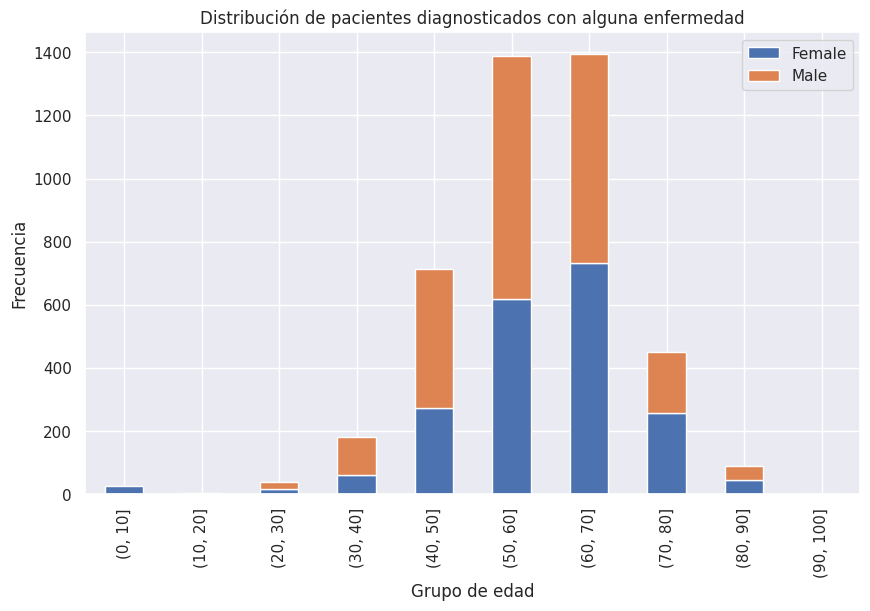

In [ ]:
age_counts = df2[df2['normal'] == 0].groupby(['age_group', 'patient_sex']).size().unstack()

# Crear el histograma por grupos de edad
age_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.xlabel('Grupo de edad')
plt.ylabel('Frecuencia')
plt.title('Distribución de pacientes diagnosticados con alguna enfermedad')
plt.legend()
plt.show()


Podemos obtener la siguiente lectura:
- En todos los rangos de edad tenemos más hombres que mujeres. En el rango de 50-70 años de pacientes con ojos con enfermedad, los hombres mantienen el número de casos pero en las mujeres sigue creciendo los casos hasta los 70 años.
- Las pacientes mujeres a pesar de tener una avanzada edad no se les ha diagnosticado ninguna enfermedad, cuando este hecho no ocurre en hombres.
- Es curioso que a las edades más tempranas, sólo se hayan recogido mujeres con
enfermedad, lo que podrían ser casos aislados, ya que a esas edades no se espera
ningún deficiencia a nivel ocular, salvo las que se desarrollen al nacer o por genética.

In [ ]:
#################
# Se ha creado una función para graficar el recuento de una característica a partir de un DataFrame.
#################

def plot_count(feature, title, df, size=1, show_all=False):
    f, ax = plt.subplots(1,1, figsize=(4*size,4))
    total = float(len(df))
    if show_all:
        g = sns.countplot(data = df, x = df[feature], palette='Set3')  # Graficar el recuento de la característica en el DataFrame completo
        g.set_title("{} distribution".format(title))  # Establecer el título del gráfico

    else:
        g = sns.countplot(df, x = df[feature], order = df[feature].value_counts().index[:20], palette='Set3')  # Graficar el recuento de la característica en los 20 valores más frecuentes
        if(size > 2):
            plt.xticks(rotation=90, size=8)  # Girar y ajustar el tamaño de las etiquetas del eje x para evitar la superposición
            for p in ax.patches:
                height = p.get_height()
                ax.text(p.get_x()+p.get_width()/2.,
                        height + 0.2,
                        '{:1.2f}%'.format(100*height/total),
                        ha="center")  # Agregar etiquetas de porcentaje encima de las barras
        g.set_title("Nombre y porcentajes de {}".format(title))  # Establecer el título del gráfico
        g.set_ylabel("Frecuencia")  # Establecer la etiqueta del eje y
        g.set_xlabel("")  # Establecer la etiqueta del eje x como una cadena vacía
    plt.show()  # Mostrar el gráfico


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65292 (\N{FULLWIDTH COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


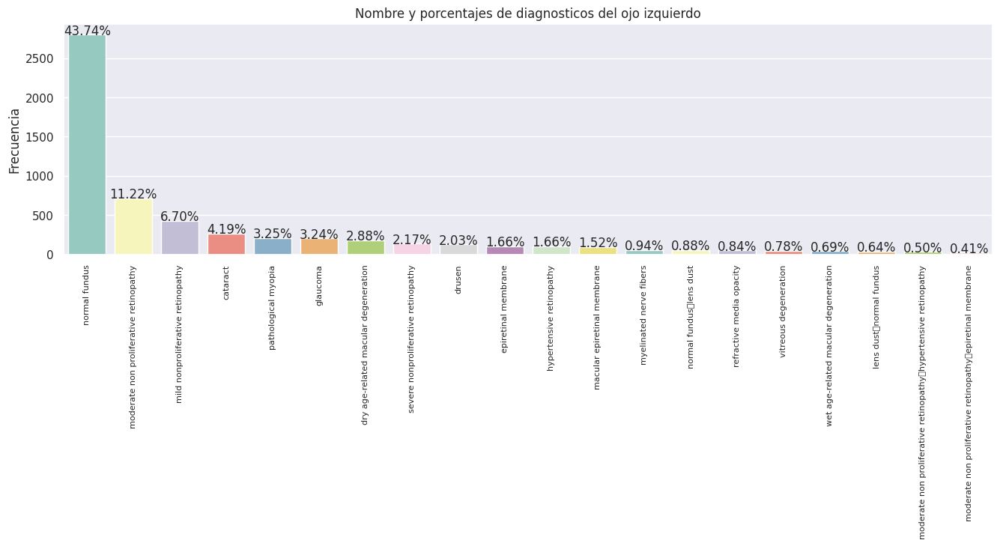

In [ ]:
plot_count("left_diagnostic_keywords", "diagnosticos del ojo izquierdo", df2, size=4)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 65292 (\N{FULLWIDTH COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


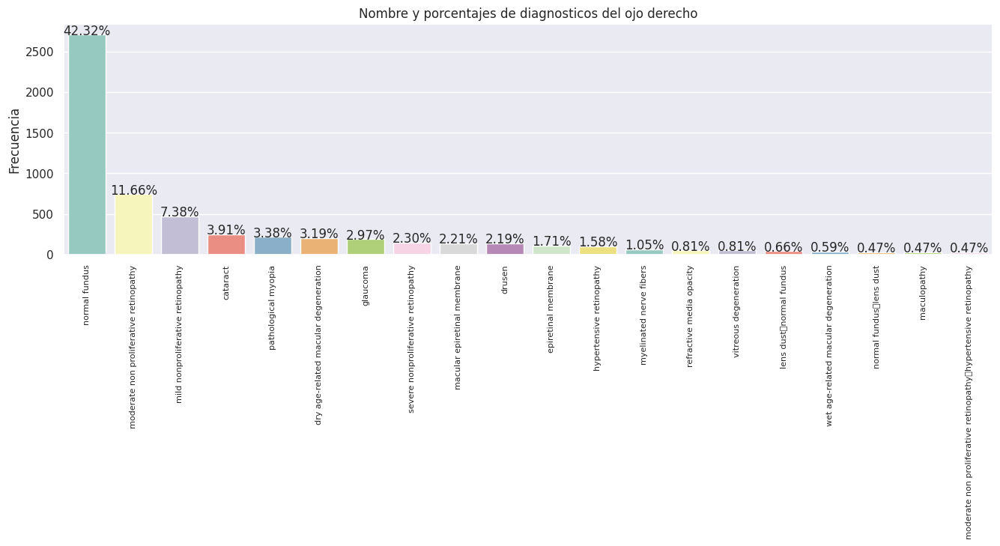

In [ ]:
plot_count("right_diagnostic_keywords", "diagnosticos del ojo derecho", df2, size=4)

En este análisis no observamos ninguna diferencia significativa entre ambos ojos por lo que descartamos que las enfermedades estén referenciadas a un ojo en concreto.

### 2. Preprocesado de datos

Una vez analizado el conjunto de datos, podemos enmarcar el problema, tal y como se presenta en el conjunto de datos disponible, de varias formas diferentes, como por ejemplo:

- Un problema de clasificación multiclase multietiqueta, en el que cada instancia (imagen) puede contener varias clases (por ejemplo, una imagen que pertenezca tanto a la clase Diabetes como a la clase Otros).
- Un problema de clasificación multiclase, en el que cada instancia puede pertenecer a una única clase (utilizando las etiquetas finales (objetivo) como clases, por ejemplo).
- Un problema de clasificación binaria, en el que sólo las instancias que pertenecen a 2 clases son muestras del conjunto de datos (por ejemplo, sólo las instancias Cataratas y Normal).

In [ ]:
#################
# Se define métodos para definir cuando consideramos la categoría como ojo afectado
# o no por esa enfermedad
#################

def is_normal(text):
    if "normal" in text:  # Verifica si la cadena de texto contiene la palabra "normal"
        return 1
    else:
        return 0

def is_cataract(text):
    if "cataract" in text:  # Verifica si la cadena de texto contiene la palabra "cataract"
        return 1
    else:
        return 0

def is_diabetes(text):
    if "retinopathy" in text:  # Verifica si la cadena de texto contiene la palabra "retinopathy"
        return 1
    else:
        return 0

def is_glaucoma(text):
    if "glaucoma" in text:  # Verifica si la cadena de texto contiene la palabra "glaucoma"
        return 1
    else:
        return 0

In [ ]:
#################
# Creamos un método que crea 2 arrays de datos que contendrán las imágenes con su etiqueta
# asociada, teniendo en cuenta la enfermedad que vamos a tratar.
#################

def preprocessingDataForModel(path_to_dataset, path_to_images, option = ""):
  '''
  Option 1: Normal eyes vs rest of eyes
  Option 2: Normal eyes vs eyes with cataract
  Option 3: Normal eyes vs eyes with diabetes
  Option 4: Normal eyes vs eyes with glaucoma

  Este método separa por categorías 0 o 1 aquellas imágenes etiquetadas como tal.
  para cada ojo. A continuación eliminamos los duplicados. Por último concatenamos
  ambos ojos por categoría asociada de 0 y 1. Obtendríamos dos arrays de datos,
  el primero que recoge las imágenes donde el ojo tiene el valor 0 asignado,
  y el segundo array donde el ojo tiene el valor 1 asignado.
  '''
  print("--------Cargando y preprocesando el conjunto de datos--------\n")
  # Load dataframe
  df2 = pd.read_csv(path_to_dataset).rename(columns=lambda x: x.replace("-", "_").replace(" ", "_").lower())

  df2 = df2.rename(columns = {'n': 'normal',
                          'd': 'diabetes',
                          'g': 'glaucoma',
                          'c': 'cataract',
                          'a': 'age_related_macular_degeneration',
                          'h': 'hypertension',
                          'm': 'pathological_myopia',
                          'o': 'other_diseases'})

  df2 = pd.concat([df2, pd.get_dummies(df2["target"], prefix="target")], axis = 1)
  df2 = df2.rename(columns = {'target_[1, 0, 0, 0, 0, 0, 0, 0]': 'target_normal',
                          'target_[0, 1, 0, 0, 0, 0, 0, 0]': 'target_diabetes',
                          'target_[0, 0, 1, 0, 0, 0, 0, 0]': 'target_glaucoma',
                          'target_[0, 0, 0, 1, 0, 0, 0, 0]': 'target_cataract',
                          'target_[0, 0, 0, 0, 1, 0, 0, 0]': 'target_age_related_macular_degeneration',
                          'target_[0, 0, 0, 0, 0, 1, 0, 0]': 'target_hypertension',
                          'target_[0, 0, 0, 0, 0, 0, 1, 0]': 'target_pathological_myopia',
                          'target_[0, 0, 0, 0, 0, 0, 0, 1]': 'target_other_diseases'})

  if option == "not_normal":
    df2["left_normal"] = df2["left_diagnostic_keywords"].apply(lambda x: is_normal(x))
    df2["right_normal"] = df2["right_diagnostic_keywords"].apply(lambda x: is_normal(x))

    print("Número de imágenes en df2: {}".format(len(df2)))

    left_not_normal = df2.loc[(df2.normal == 0) & (df2.left_normal == 0)]["left_fundus"].drop_duplicates().sample(500,random_state=42).values
    right_not_normal = df2.loc[(df2.normal == 0) & (df2.right_normal == 0)]["right_fundus"].drop_duplicates().sample(500,random_state=42).values

    print("Número de imágenes en el ojo izquierdo no normal: {}".format(len(left_not_normal)))
    print("Número de imágenes en el ojo derecho no normal: {}".format(len(right_not_normal)))

    left_normal = df2.loc[(df2.normal == 1) & (df2.left_normal == 1)]["left_fundus"].drop_duplicates().sample(500,random_state=42).values
    right_normal = df2.loc[(df2.normal == 1) & (df2.right_normal == 1)]["right_fundus"].drop_duplicates().sample(500,random_state=42).values

    print("Número de imágenes en el ojo izquierdo normal: {}".format(len(left_normal)))
    print("Número de imágenes en el ojo derecho normal: {}".format(len(right_normal)))

    not_normal = np.concatenate((left_not_normal,right_not_normal),axis=0)
    normal = np.concatenate((left_normal,right_normal),axis=0)

    return not_normal, normal

  elif option == "cataract":


    df2["left_cataract"] = df2["left_diagnostic_keywords"].apply(lambda x: is_cataract(x))
    df2["right_cataract"] = df2["right_diagnostic_keywords"].apply(lambda x: is_cataract(x))

    print("Número de imágenes en df2: {}".format(len(df2)))

    left_cataract = df2.loc[(df2.cataract ==1) & (df2.left_cataract == 1)]["left_fundus"].values
    right_cataract = df2.loc[(df2.cataract ==1) & (df2.right_cataract == 1)]["right_fundus"].values

    print("Número de imágenes en el ojo izquierdo no normal: {}".format(len(left_not_normal)))
    print("Número de imágenes en el ojo derecho no normal: {}".format(len(right_not_normal)))

    left_normal = df2.loc[(df2.cataract ==0) & (df2["left_diagnostic_keywords"] == "normal fundus")]["left_fundus"].sample(250,random_state=42).values
    right_normal = df2.loc[(df2.cataract ==0) & (df2["right_diagnostic_keywords"] == "normal fundus")]["right_fundus"].sample(250,random_state=42).values

    print("Número de imágenes en el ojo izquierdo normal: {}".format(len(left_normal)))
    print("Número de imágenes en el ojo derecho normal: {}".format(len(right_normal)))

    not_normal = np.concatenate((left_cataract,right_cataract),axis=0)
    normal = np.concatenate((left_normal,right_normal),axis=0)


    return not_normal, normal

  elif option == "diabetes":
    df2["left_diabetes"] = df2["left_diagnostic_keywords"].apply(lambda x: is_diabetes(x))
    df2["right_diabetes"] = df2["right_diagnostic_keywords"].apply(lambda x: is_diabetes(x))

    print("Número de imágenes en df2: {}".format(len(df2)))

    left_diabetes = df2.loc[(df2.diabetes ==1) & (df2.left_diabetes == 1)]["left_fundus"].drop_duplicates().sample(500,random_state=42).values
    right_diabetes = df2.loc[(df2.diabetes ==1) & (df2.right_diabetes == 1)]["right_fundus"].drop_duplicates().sample(500,random_state=42).values

    print("Número de imágenes en el ojo izquierdo no normal: {}".format(len(left_not_normal)))
    print("Número de imágenes en el ojo derecho no normal: {}".format(len(right_not_normal)))

    left_normal = df2.loc[(df2.diabetes ==0) & (df2["left_diagnostic_keywords"] == "normal fundus")]["left_fundus"].drop_duplicates().sample(500,random_state=42).values
    right_normal = df2.loc[(df2.diabetes ==0) & (df2["right_diagnostic_keywords"] == "normal fundus")]["right_fundus"].drop_duplicates().sample(500,random_state=42).values

    print("Número de imágenes en el ojo izquierdo normal: {}".format(len(left_normal)))
    print("Número de imágenes en el ojo derecho normal: {}".format(len(right_normal)))

    not_normal = np.concatenate((left_diabetes,right_diabetes),axis=0)
    normal = np.concatenate((left_normal,right_normal),axis=0)

    return not_normal, normal

  elif option == "glaucoma":
    df2["left_glaucoma"] = df2["left_diagnostic_keywords"].apply(lambda x: is_glaucoma(x))
    df2["right_glaucoma"] = df2["right_diagnostic_keywords"].apply(lambda x: is_glaucoma(x))

    print("Número de imágenes en df2: {}".format(len(df2)))

    left_glaucoma = df2.loc[(df2.glaucoma ==1) & (df2.left_glaucoma == 1)]["left_fundus"].drop_duplicates().values
    right_glaucoma = df2.loc[(df2.glaucoma ==1) & (df2.right_glaucoma == 1)]["right_fundus"].drop_duplicates().values

    print("Número de imágenes en el ojo izquierdo no normal: {}".format(len(left_not_normal)))
    print("Número de imágenes en el ojo derecho no normal: {}".format(len(right_not_normal)))

    left_normal = df2.loc[(df2.glaucoma ==0) & (df2["left_diagnostic_keywords"] == "normal fundus")]["left_fundus"].drop_duplicates().sample(250,random_state=42).values
    right_normal = df2.loc[(df2.glaucoma ==0) & (df2["right_diagnostic_keywords"] == "normal fundus")]["right_fundus"].drop_duplicates().sample(250,random_state=42).values

    print("Número de imágenes en el ojo izquierdo normal: {}".format(len(left_normal)))
    print("Número de imágenes en el ojo derecho normal: {}".format(len(right_normal)))

    not_normal = np.concatenate((left_glaucoma,right_glaucoma),axis=0)
    normal = np.concatenate((left_normal,right_normal),axis=0)

    return not_normal, normal


In [ ]:
#################
# Función para crear un conjunto de datos de imágenes y etiquetas
# image_category: categoría de imágenes
# label: etiqueta asociada a las imágenes
# path_to_images: ruta donde se encuentran las imágenes
# image_size: tamaño deseado para las imágenes
# dataset: conjunto de datos a crear
#################

def create_dataset(image_category, label, path_to_images, image_size, dataset):
    # Crear conjunto de datos de imágenes y etiquetas
    print("---------------Creando conjunto de datos de imágenes y etiquetas---------------\n")
    labels = []
    for img in image_category:
        image_path = os.path.join(path_to_images,img)
        try:
            # Cargar imagen y cambiar tamaño
            image = cv2.imread(image_path,cv2.IMREAD_COLOR)
            image = cv2.resize(image,(image_size,image_size))

            # print(f"Imagen cargada: {image_path}")
        except:
            # print(f"Error con la imagen {image_path}")
            continue
        dataset.append([np.array(image),np.array(label)])

    random.shuffle(dataset)
    return dataset


### Ejecucion del preprocesado

Una vez que hemos definido todos los métodos que nos van a ayudar a realizar todas nuestras tareas, creamos todos los conjuntos de datos, para su posterior
modelado.

In [ ]:
path_to_dataset = "/content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/full_df.csv"
path_to_images = "/content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/preprocessed_images"
image_size=224

print("---------------Creando los splits para cada enfermedad---------------\n")
not_normal, normal = preprocessingDataForModel(path_to_dataset, path_to_images, "not_normal")
# not_normal_cataract, normal_cat = preprocessingDataForModel(path_to_dataset, path_to_images, "cataract")
# not_normal_diabetes, normal_diab = preprocessingDataForModel(path_to_dataset, path_to_images, "diabetes")
# not_normal_glaucoma, normal_glau = preprocessingDataForModel(path_to_dataset, path_to_images, "glaucoma")

print("---------------Creando los datasets---------------\n")
dataset_normal = []
dataset_normal = create_dataset(not_normal,0, path_to_images, image_size, dataset_normal)
dataset_normal = create_dataset(normal,1, path_to_images, image_size, dataset_normal)

# dataset_cataract = []
# dataset_cataract = create_dataset(not_normal_cataract,1, path_to_images, image_size, dataset_cataract)
# dataset_cataract = create_dataset(normal_cat,0, path_to_images, image_size, dataset_cataract)

# dataset_diabetes = []
# dataset_diabetes = create_dataset(not_normal_diabetes,1, path_to_images,image_size, dataset_diabetes)
# dataset_diabetes = create_dataset(normal_diab,0, path_to_images, image_size, dataset_diabetes)

# dataset_glaucoma = []
# dataset_glaucoma = create_dataset(not_normal_glaucoma,1, path_to_images, image_size, dataset_glaucoma)
# dataset_glaucoma = create_dataset(normal_glau,0, path_to_images, image_size, dataset_glaucoma)



---------------Creando los splits para cada enfermedad---------------

--------Loading and preprocessing dataset--------

Number of images in df2: 6392
Number of images in left not normal: 500
Number of images in right not normal: 500
Number of images in left normal: 500
Number of images in right normal: 500
---------------Creando los datasets---------------

---------------Creating dataset of images and labels---------------

---------------Creating dataset of images and labels---------------



### Definición de estilos y creación de métodos para gráficos

En esta sección definimos todas las características y los métodos que queremos para realizar las gráficas que mostrarán las métricas de rendimiento de nuestros modelos.

In [ ]:
labels_long = ["Normal", "Diabetes", "Glaucoma", "Cataract", "AMD", "Hypertension", "Myopia", "Other"]  # Lista de etiquetas largas
labels_short = [ll[0] for ll in labels_long]  # Lista de etiquetas cortas obtenidas a partir de las etiquetas largas

class_short2full = {  # Diccionario que mapea las etiquetas cortas a las etiquetas largas
    ls: ll
    for ls, ll in zip(labels_short, labels_long)
}

class_dict = {class_ : i for i, class_ in enumerate(class_short2full.keys())}  # Diccionario que asigna un índice numérico a cada etiqueta corta
class_dict_rev = {v: k for k, v in class_dict.items()}  # Diccionario que asigna una etiqueta corta a cada índice numérico

NUM_CLASSES = len(class_dict)  # Número de clases

COLORS = {  # Diccionario de colores
    "fig_bg": "#f6f5f5",  # Color de fondo de la figura
    "plot_neut": "#ddbea9",  # Color neutral del gráfico
    "plot_text": "#343a40",  # Color del texto del gráfico

    "cmap_color_list": ["#001219", "#005F73", "#0A9396", "#94D2BD", "#E9D8A6",
                        "#EE9B00", "#CA6702", "#BB3E03", "#AE2012", "#9B2226"],  # Lista de colores para el mapa de colores

    "split": {  # Diccionario de colores para la división de datos
        "train": "#264653",  # Color para el conjunto de entrenamiento
        "val": "#2a9d8f",  # Color para el conjunto de validación
        "test": "#e9c46a"  # Color para el conjunto de prueba
    }
}

COLORS["class"] = {ls: c for ls, c in zip(class_short2full.keys(), COLORS["cmap_color_list"][:len(class_short2full.keys())])}  # Diccionario de colores para cada clase
COLORS["cmap"] = mpl.colors.LinearSegmentedColormap.from_list("", COLORS["cmap_color_list"])  # Mapa de colores lineal segmentado
COLORS["cmap_pos"] = mpl.colors.LinearSegmentedColormap.from_list("", ["#F0F3F8", "#D1DBE9", "#A2B7D2", "#7493BC", "#6487B4", "#3D5A80"])  # Mapa de colores lineal segmentado para valores positivos

colors_class_list = list(COLORS["class"].values())  # Lista de colores de las clases

FONT_KW = {  # Diccionario de estilos de fuente
    "plot_title" : {  # Título del gráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "25",
        "style": "normal"
    },
    "plot_title_small" : {  # Título pequeño del gráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "16",
        "style": "normal"
    },
    "plot_subtitle" : {  # Subtítulo del gráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "12",
        "style": "normal"
    },
    "subplot_title" : {  # Título de subgráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "18",
        "style": "normal"
    },
    "subplot_title_small" : {  # Título pequeño de subgráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "12",
        "style": "normal"
    },
    "plot_label" : {  # Etiqueta del gráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "16",
        "style": "normal"
    },
    "plot_label_small" : {  # Etiqueta pequeña del gráfico
        "fontname": "serif",
        "weight": "bold",
        "size": "12",
        "style": "normal"
    },
    "plot_text" : {  # Texto del gráfico
        "fontname": "serif",
        "weight": "normal",
        "size": "12",
        "style": "normal"
    },
    "plot_text_small" : {  # Texto pequeño del gráfico
        "fontname": "serif",
        "weight": "normal",
        "size": "8",
        "style": "normal"
    },
}


In [ ]:
#################
# Función para obtener las dimensiones de los subplots según el número total de subplots requeridos
# N: número total de subplots
#################

def get_subplot_dims(N):
    # Calcular el número de filas y columnas necesarias
    r = np.ceil(np.sqrt(N))
    c = np.floor(np.sqrt(N))
    # Ajustar el número de filas si no se llena completamente la matriz de subplots
    if r*c < N:
        r += 1
    return int(r), int(c)


In [8]:
#################
# Función para graficar el historial de entrenamiento
# history: historial del entrenamiento del modelo
# start_epoch: número de la época inicial para mostrar en el gráfico
# is_shift_val: indicador de desplazamiento de los valores de validación
# suptitle: título principal del gráfico
# subtitle: subtítulo del gráfico
# **fig_opts: opciones adicionales para la figura
#################


def plot_train(history, start_epoch=0, is_shift_val=True, suptitle=None, subtitle=None, **fig_opts):
    # Crear un DataFrame a partir del historial de entrenamiento
    history_df = pd.DataFrame(history.history)
    # Obtener las métricas del historial
    mets = history_df.columns[history_df.columns.str.startswith("val")].str.replace("val_","").tolist()
    # Obtener la longitud del historial
    L = history_df.shape[0]

    # Obtener las dimensiones de la matriz de subplots
    nrows, ncols = get_subplot_dims(len(mets))

    # Crear una figura con las opciones proporcionadas
    fig = plt.figure(**fig_opts)
    # Ajustar los espacios entre los subplots
    fig.subplots_adjust(hspace=0.75, wspace=0.75)
    # Establecer el color de fondo de la figura
    fig.patch.set_facecolor(COLORS["fig_bg"])

    # Recorrer las métricas y crear los subplots correspondientes
    for i, met in enumerate(mets):
        # Determinar el valor máximo o mínimo de la métrica para el entrenamiento y validación
        if met == "loss":
            value_train = np.round(history_df[met].min(), 4)
            value_val = np.round(history_df["val_"+met].min(), 4)
        else:
            value_train = np.round(history_df[met].max(), 4)
            value_val = np.round(history_df["val_"+met].max(), 4)

        # Crear el subplot correspondiente
        ax = plt.subplot(nrows, ncols, i+1)

        # Graficar la métrica para el entrenamiento y validación
        ax.plot(np.arange(start_epoch, L), history_df[met].iloc[start_epoch:], color=COLORS["split"]["train"])
        ax.plot(np.arange(start_epoch - is_shift_val*0.5, L - is_shift_val*0.5), history_df["val_"+met].iloc[start_epoch:], color=COLORS["split"]["val"])

        # Establecer el título del subplot
        ax.set_title(met, **FONT_KW["subplot_title_small"], pad=30)
        ax.set_xlabel("época", **FONT_KW["plot_text_small"])
        ax.set_ylabel("")
        ax.legend(["entrenamiento", "validación"], prop={"family": "serif", "size": 8}, facecolor=COLORS["fig_bg"])

        plt.xticks(**FONT_KW["plot_text_small"])
        plt.yticks(**FONT_KW["plot_text_small"])

        ax.text(
            0.5, 1.1,
            f"Mejor {met} entrenamiento: {value_train}\n" +\
            f"Mejor {met} validación: {value_val}",
            **FONT_KW["plot_text_small"],
            color=COLORS["plot_text"],
            transform=ax.transAxes,
            ha="center",
            bbox={
                "boxstyle": "Round",
                "fill": False,
                "edgecolor": COLORS["plot_text"]
            }
        )

        ax.set_facecolor(COLORS["fig_bg"])
        for spine in ["right", "top"]:
            ax.spines[spine].set_visible(False)

    # Agregar el título principal si se proporciona
    if suptitle is not None:
        plt.suptitle(
            x=0.5, y=1.005,
            t=suptitle,
            ha="center",
            va="bottom",
            **FONT_KW["plot_title_small"],
            color=COLORS["plot_text"]
        )

    # Agregar el subtítulo si se proporciona
    if subtitle is not None:
        plt.figtext(
            x=0.5, y=0.98,
            s=subtitle,
            ha="center",
            va="bottom",
            **FONT_KW["plot_subtitle"],
            color=COLORS["plot_text"]
        )
    # Mostrar el gráfico
    plt.show()


### Definición de método de definción y creación de modelo.

En este apartado nos centramos en la configuraciones que vamos a aplicar a los modelos que vamos a desarrollar. Estableceremos ajustes relacionados con los pesos iniciales del modelo, tipo de modelo preentrenado, estructura del modelo (secuencial, paralelo, etc), añadir capas a conveniencia, etc.

In [ ]:
#################
# Función para crear un modelo de red neuronal convolucional
# model_to_apply: modelo a aplicar ("vgg19" o "inception_v3")
# dropout_rate: tasa de abandono para las capas de dropout
# regularization: tipo de regularización a aplicar ("l1" o "l2")
# gamma: tipo de inicialización de gamma ("scale")
#################

def create_model(model_to_apply="", dropout_rate=0.0, regularization=None, gamma=None):
    model = None
    # Crear el modelo VGG19 preentrenado
    if model_to_apply == "vgg19":
        vgg = tf.keras.applications.VGG19(weights="imagenet", include_top=False, input_shape=(image_size, image_size, 3))
        for layer in vgg.layers:
            layer.trainable = False
        model = tf.keras.Sequential()
        model.add(vgg)
        model.add(tf.keras.layers.Flatten())

    # Crear el modelo Inception V3 preentrenado
    elif model_to_apply == "inception_V3":
        inception = tf.keras.applications.inception_v3.InceptionV3(weights="imagenet",
                                                                    include_top=False,
                                                                    input_shape=(image_size, image_size, 3))
        for layer in inception.layers:
            layer.trainable = False
        model = tf.keras.Sequential()
        model.add(inception)
        model.add(tf.keras.layers.Flatten())

    # Agregar una capa de dropout si se especifica una tasa de abandono mayor a cero
    if dropout_rate > 0.0:
        model.add(tf.keras.layers.Dropout(dropout_rate))

    # Agregar una capa densa con regularización L1 si se especifica "l1" como tipo de regularización
    if regularization == "l1":
        model.add(tf.keras.layers.Dense(64, activation="relu", kernel_regularizer=tf.keras.regularizers.l1()))

    # Agregar una capa densa con regularización L2 si se especifica "l2" como tipo de regularización
    if regularization == "l2":
        model.add(tf.keras.layers.Dense(64, activation="relu", kernel_regularizer=tf.keras.regularizers.l2()))

    # Agregar una capa densa con inicialización de gamma "scale" si se especifica "scale" como tipo de inicialización de gamma
    if gamma == "scale":
        model.add(tf.keras.layers.Dense(64, activation="relu", kernel_regularizer=tf.keras.regularizers.l2(),
                                        kernel_initializer=tf.keras.initializers.glorot_normal(),
                                        bias_initializer=tf.keras.initializers.Constant(value=1.0)))

    # Agregar la capa de salida con activación sigmoide
    model.add(tf.keras.layers.Dense(1, activation="sigmoid"))
    model.summary()

    # Compilar el modelo con el optimizador Adam, la función de pérdida de entropía cruzada binaria y las métricas de evaluación
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.001),
                  loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
                  metrics=["accuracy",
                           tf.keras.metrics.AUC(name="auc",),
                           tf.keras.metrics.Precision(name="prec"),
                           tf.keras.metrics.AUC(name="prc", curve='PR')])

    return model


In [ ]:
def execute_model(dataset, model_name="", model_to_apply="", category_0="", category_1="", random_search=False, cut_off_value=0.5):
  '''
  dataset: el conjunto de datos que se utilizará para modelar
  model_name: como los modelos se utilizan y luego se guardan, se necesita el nombre del modelo deseado
  model_to_apply: el modelo que se desea utilizar (por ejemplo, RestNet, vgg19, inception_V3)
  category_0: las categorías que se han asignado con el valor 0 en los datos procesados (normal, catarata, diabetes, glaucoma)
  category_1: las categorías que se han asignado con el valor 1 en los datos procesados (no_normal, normal, normal, normal)
  '''

  EPOCHS = 15
  model = None
  model_builder = None
  best_model = None
  dropout_rate = None
  regularization_value = "Sin regularización"
  gamma_yes_or_no = "No"

  # Se crea el conjunto para las imágenes a partir del conjunto de datos
  x = np.array([i[0] for i in dataset]).reshape(-1, image_size, image_size, 3)
  # Se crea el conjunto para las etiquetas a partir del conjunto de datos
  y = np.array([i[1] for i in dataset])

  # Dividir los datos en conjuntos de entrenamiento y prueba
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle=True)

  # Definir el modelo
  print("--------------- Definiendo el modelo " + model_to_apply + " ---------------\n")
  if model_to_apply == "vgg19":
      # Parámetros para la búsqueda aleatoria
      param_grid = {
          "dropout_rate": [0.1, 0.2, 0.3],
          "regularization": [None, "l1", "l2"],
          "gamma": [None, "scale"]
      }

      # Función de construcción del modelo vgg19
      model_builder = lambda dropout_rate, regularization, gamma: create_model("vgg19", dropout_rate, regularization, gamma)

  elif model_to_apply == "inception_V3":
      # Parámetros para la búsqueda aleatoria
      param_grid = {
          "dropout_rate": [0.1, 0.2, 0.3],
          "regularization": [None, "l1", "l2"],
          "gamma": [None, "scale"]
      }

      # Función de construcción del modelo inception_V3
      model_builder = lambda dropout_rate, regularization, gamma: create_model("inception_V3", dropout_rate, regularization, gamma)



  if random_search:
      # Si se realiza una búsqueda aleatoria
      print("Búsqueda aleatoria: Sí")

      # Se define el objeto de búsqueda aleatoria RandomizedSearchCV
      # Se utiliza KerasClassifier como estimador, con el constructor de modelos model_builder
      # param_distributions especifica los hiperparámetros y sus rangos para la búsqueda aleatoria
      # n_iter indica el número de combinaciones aleatorias a probar
      # cv es el número de divisiones para la validación cruzada
      # n_jobs especifica el número de trabajos en paralelo (-1 utiliza todos los núcleos de CPU disponibles)
      # verbose muestra información detallada durante la búsqueda aleatoria
      search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3, n_jobs=-1, verbose=1)

      # Realizar la búsqueda aleatoria ajustando el modelo a los datos de entrenamiento
      search.fit(x_train, y_train)

      # Obtener el mejor modelo encontrado durante la búsqueda
      best_model = search.best_estimator_.model

      # Compilar el mejor modelo con los parámetros adecuados
      best_model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.001),
                        loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
                        metrics=["accuracy",
                                  tf.keras.metrics.AUC(name="auc",),
                                  tf.keras.metrics.Precision(name="prec"),
                                  tf.keras.metrics.AUC(name="prc", curve='PR')])
  else:
      # Si no se realiza una búsqueda aleatoria
      print("Búsqueda aleatoria: No")

      # Construir el modelo utilizando model_builder con los parámetros predeterminados
      best_model = model_builder(dropout_rate=0.0, regularization=None, gamma=None)


  # Definir callbacks
  print("---------------Definir callbacks---------------\n")
  early_stopping = tf.keras.callbacks.EarlyStopping(patience=EPOCHS//3, verbose=1)
  checkpoint = tf.keras.callbacks.ModelCheckpoint("/content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/" + model_to_apply + "_" + model_name + ".h5",
                                                  monitor="val_accuracy", verbose=1, save_best_only=True, save_weights_only=False, save_freq="epoch")

  # Entrenar el modelo
  print("---------------Entrenar el modelo---------------\n")
  history = best_model.fit(x_train, y_train, epochs=30, validation_data=(x_test, y_test),
                           callbacks=[checkpoint, early_stopping])

  # Imprimir información sobre las capas del mejor modelo
  print("---------------Capas de nuestro mejor modelo---------------\n")

  # Inicializar contador
  count = 0

  # Iterar sobre las capas del mejor modelo
  for layer in best_model.layers:
      # Imprimir el nombre de la capa
      print(layer.name)

      # Imprimir el tipo de capa
      print("Esta capa es de tipo:", layer.__class__.__name__)

      # Verificar si la capa es de tipo Dropout
      if isinstance(layer, tf.keras.layers.Dropout):
          # Imprimir el valor de Dropout
          print("Valor de Dropout:", layer.rate)
          dropout_rate = layer.rate

      # Verificar si la capa es de tipo Dense y tiene regularización
      if isinstance(layer, tf.keras.layers.Dense) and layer.kernel_regularizer:
          # Imprimir el tipo de regularización
          print("Tipo de regularización:", layer.kernel_regularizer.__class__.__name__)
          # Imprimir el valor de regularización
          print("Valor de regularización:", layer.kernel_regularizer.get_config())

          # Actualizar el valor de regularización
          regularization_value = layer.kernel_regularizer.__class__.__name__

          # Incrementar el contador
          count = count + 1

          # Comprobar si hay más de una capa con regularización
          if count > 1:
              regularization_value = regularization_value + "/" + layer.kernel_regularizer.__class__.__name__

      # Imprimir separador
      print("---")

  # Verificar si el valor de regularización es "L2/L2"
  if regularization_value == "L2/L2":
      gamma_yes_or_no = "Sí"


  # Mostrar el informe de métricas
  print('\n-----------------------------------')
  print('Informe de métricas')
  print('-----------------------------------')

  plot_train(history, start_epoch=1, figsize=(10,8), suptitle=model_to_apply, subtitle=f"Dropout=" + str(dropout_rate) + ", Regularización= "+ regularization_value +  ", Gamma= " + gamma_yes_or_no)

  # Obtener las probabilidades predichas
  y_pred = best_model.predict(x_test)
  y_pred_binary = np.where(y_pred >= cut_off_value, 1, 0)

  # Calcular la matriz de confusión
  matriz_confusion = confusion_matrix(y_true=y_test, y_pred=y_pred_binary)

  # Mostrar el informe de clasificación
  print('\n-----------------------------------')
  print('Informe de clasificación')
  print('-----------------------------------')
  report = classification_report(y_test, y_pred_binary)
  print(report)

  # Mostrar la matriz de confusión y el número de predicciones
  labels = ['Sí: 0', 'Sí: 1']
  fig, ax = plt.subplots(figsize=(8, 7))
  cax = ax.matshow(matriz_confusion, cmap=plt.cm.Blues)
  fig.colorbar(cax)
  ax.set_title('Matriz de confusión')
  ax.set_xticklabels([''] + labels)
  ax.set_yticklabels([''] + labels)

  for i in range(matriz_confusion.shape[0]):
      for j in range(matriz_confusion.shape[1]):
          ax.text(j, i, f'{matriz_confusion[i, j]}',
                  ha='center', va='center', color='black', weight="bold")

  plt.xlabel('Predicho')
  plt.ylabel('Esperado')
  plt.show()

  # Mostrar ejemplos de imágenes de los ojos
  print('\n-----------------------------------')
  print('Ejemplos de predicción de imágenes de los ojos')
  print('-----------------------------------')

  plt.figure(figsize=(12, 7))
  for i in range(10):
      sample = random.choice(range(len(x_test)))
      image = x_test[sample]
      category = y_test[sample]
      pred_category = y_pred_binary[sample]

      if category == 0:
          label = category_0
      else:
          label = category_1

      if pred_category == 0:
          pred_label = category_0
      else:
          pred_label = category_1

      plt.subplot(2, 5, i + 1)
      plt.imshow(image)
      plt.xlabel("Real:{}\nPredicción:{}".format(label, pred_label))
  plt.tight_layout()

  return history, best_model

### Ejecución de los casos de estudios propuestos
A continuación realizaremos las diversas pruebas propuestas para este proyecto.
Estas pruebas contan de las siguientes configuraciones:
- Modelos preentrenados: VGG19 o INceptionV3
- Busqueda en malla de paramétros con RandomizedSearchCV (activado o no)
- Ajuste de valor cut_off para ajustar la evaluación de la predicción.

#### Ejecución de modelos para Normal vs rest

---------------Creating the model for normal vs rest---------------

--------------- Defining the model inception_V3 ---------------

Random search: No
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_3 (Flatten)         (None, 51200)             0         
                                                                 
 dense_3 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 1529 samples, validate on 383 samples
Epoch 1

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.51697, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_rest.h5
1529/1529 [==============================] - 12s 8ms/sample - loss: 19.1963 - accuracy: 0.5154 - auc: 0.5170 - prec: 0.5225 - prc: 0.5174 - val_loss: 12.9851 - val_accuracy: 0.5170 - val_auc: 0.5523 - val_prec: 0.8824 - val_prc: 0.6039
Epoch 2/30
1529/1529 [==============================] - ETA: 0s - loss: 4.4916 - accuracy: 0.6233 - auc: 0.6492 - prec: 0.6325 - prc: 0.6238
Epoch 2: val_accuracy improved from 0.51697 to 0.51958, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_rest.h5
1529/1529 [==============================] - 5s 3ms/sample - loss: 4.4916 - accuracy: 0.6233 - auc: 0.6492 - prec: 0.6325 - prc: 0.6238 - val_loss: 12.5961 - val_accuracy: 0.5196 - val_auc: 0.5125 - val_prec: 0.5186 - val_prc: 0.5234
Epoch 3/30
1529/1

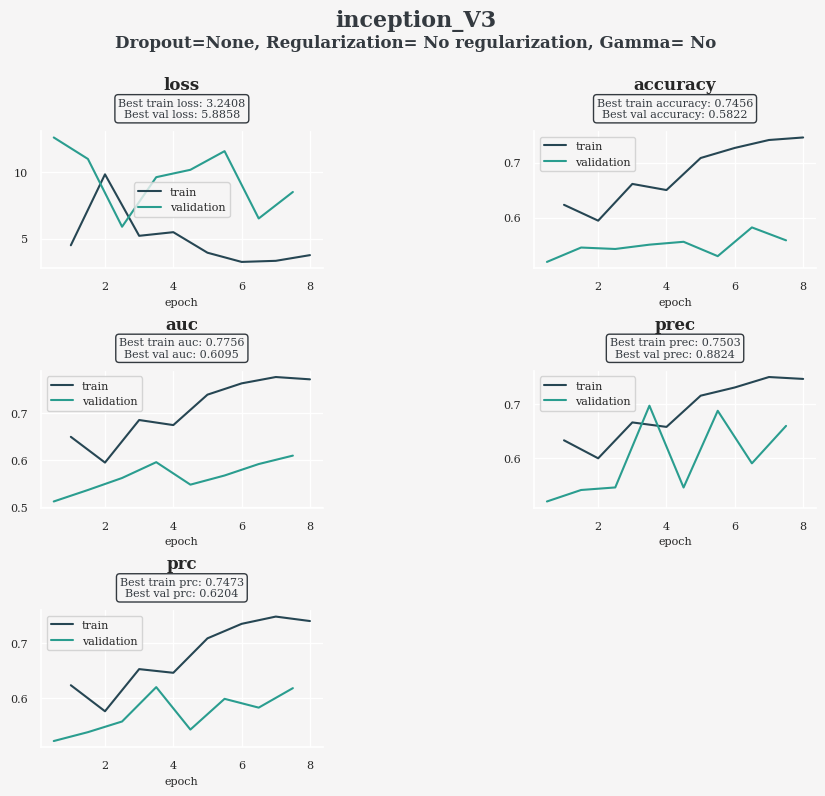

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.53      0.83      0.65       185
           1       0.66      0.30      0.42       198

    accuracy                           0.56       383
   macro avg       0.59      0.57      0.53       383
weighted avg       0.60      0.56      0.53       383



<ipython-input-12-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-12-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


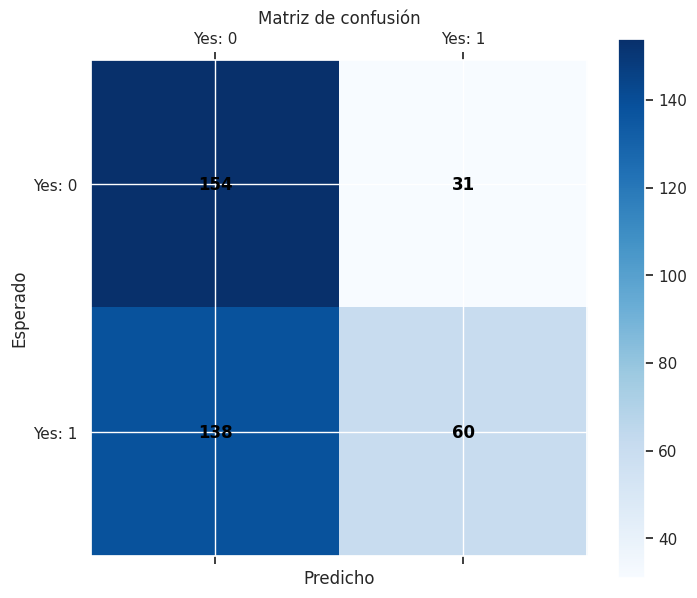


-----------------------------------
Eyes image prediction samples
-----------------------------------


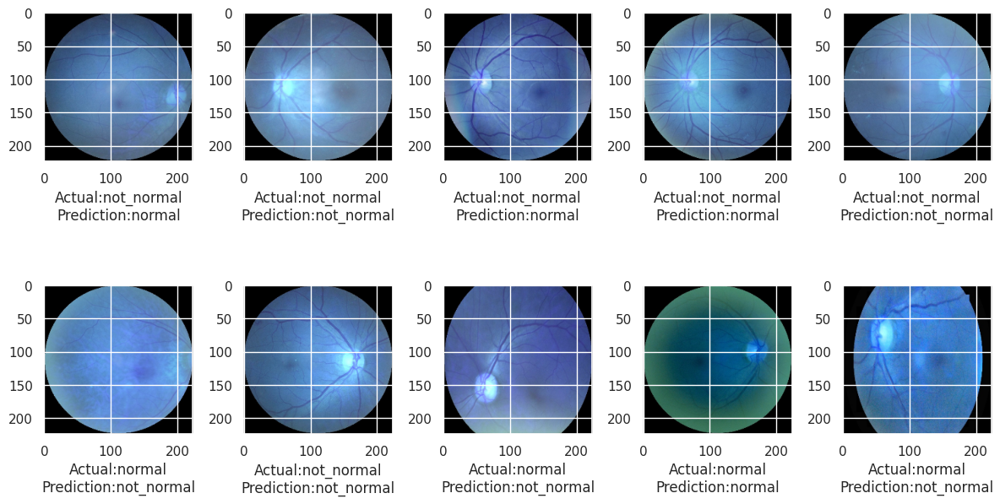

In [ ]:
print("---------------Creating the model for normal vs rest---------------\n")
history_1, model_1 = execute_model(dataset_normal, "normal_vs_rest", "inception_V3", "not_normal", "normal", False, 0.5)

---------------Creating the model for normal vs rest---------------

--------------- Defining the model inception_V3 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-14-37803451a9e4>:95: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
Instructions for updating:
Colocations handled automatically by placer.


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 51200)             0         
                                                                 
 dropout (Dropout)           (None, 51200)             0         
                                                                 
 dense (Dense)               (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
Train on 1529 samples
1529/1529 [==============================] - 9s 6ms/sample - loss: 20.4400 - accuracy: 0.5010 - auc: 0.5015 - prec: 0.5109 - prc: 0.5114
------------

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.55352, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_rest.h5
1529/1529 [==============================] - 10s 7ms/sample - loss: 14.7725 - accuracy: 0.5625 - auc: 0.5650 - prec: 0.5731 - prc: 0.5561 - val_loss: 9.4052 - val_accuracy: 0.5535 - val_auc: 0.5723 - val_prec: 0.5983 - val_prc: 0.5767
Epoch 2/30
1529/1529 [==============================] - ETA: 0s - loss: 6.1421 - accuracy: 0.6357 - auc: 0.6556 - prec: 0.6438 - prc: 0.6257
Epoch 2: val_accuracy improved from 0.55352 to 0.57963, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_rest.h5
1529/1529 [==============================] - 5s 3ms/sample - loss: 6.1421 - accuracy: 0.6357 - auc: 0.6556 - prec: 0.6438 - prc: 0.6257 - val_loss: 8.3391 - val_accuracy: 0.5796 - val_auc: 0.5927 - val_prec: 0.6093 - val_prc: 0.5866
Epoch 3/30
1529/152

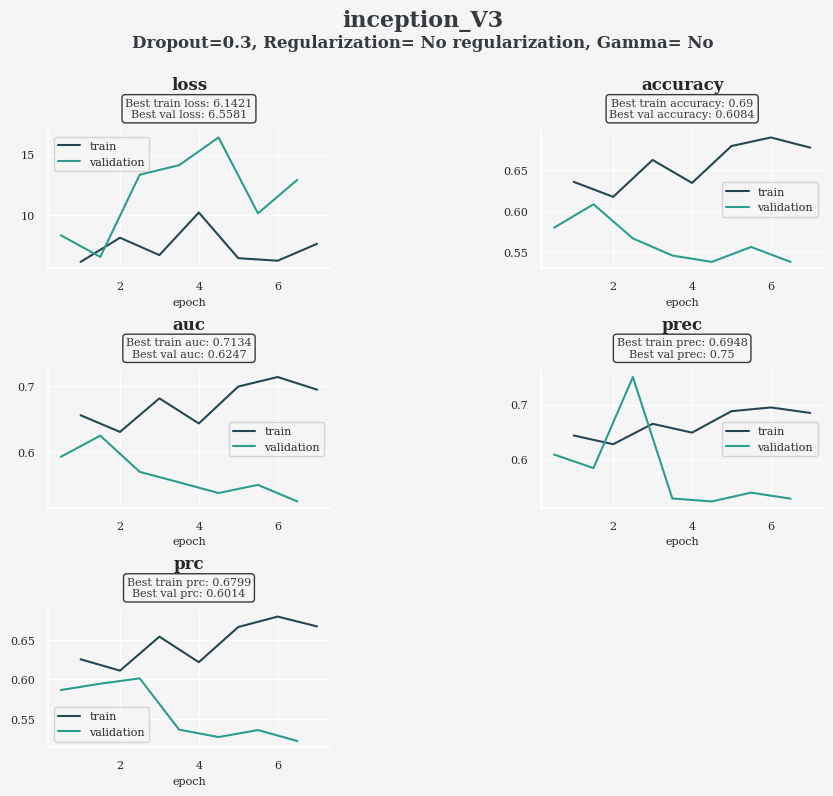

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.57      0.27      0.37       189
           1       0.53      0.80      0.64       194

    accuracy                           0.54       383
   macro avg       0.55      0.53      0.50       383
weighted avg       0.55      0.54      0.50       383



<ipython-input-14-37803451a9e4>:185: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-14-37803451a9e4>:186: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


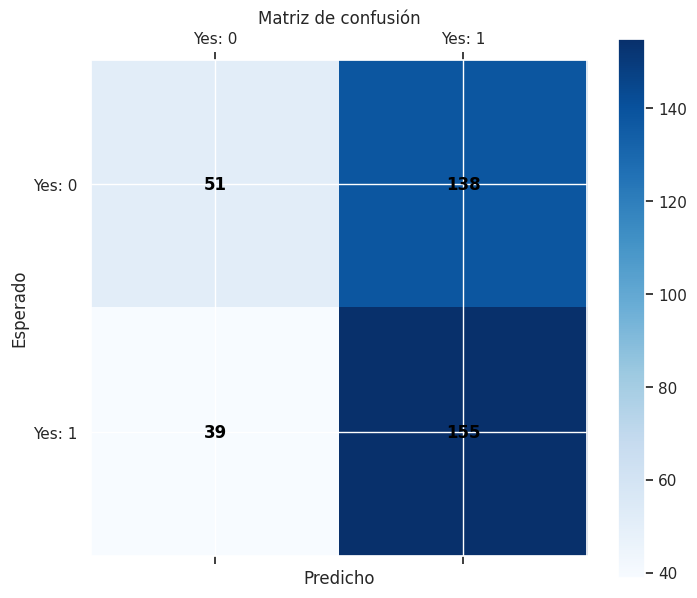


-----------------------------------
Eyes image prediction samples
-----------------------------------


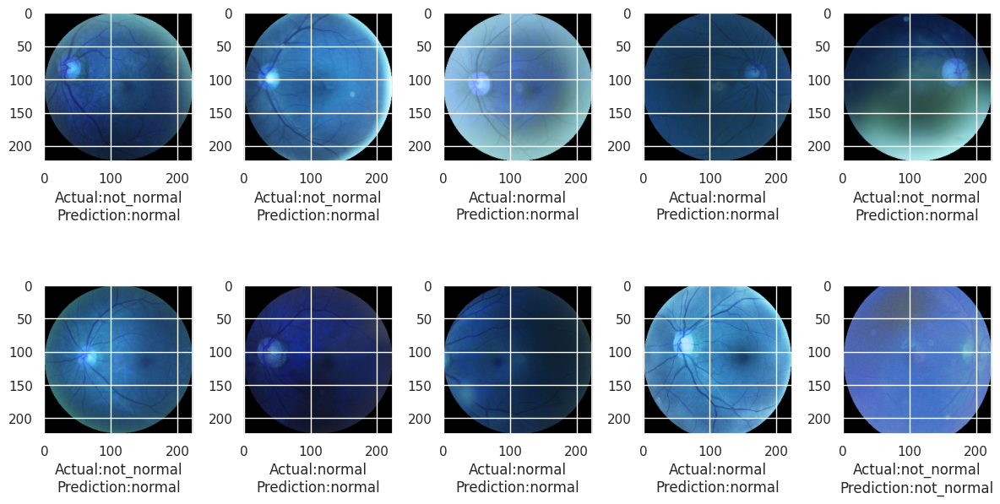

In [ ]:
print("---------------Creating the model for normal vs rest---------------\n")
history_2, model_2 = execute_model(dataset_normal, "normal_vs_rest", "inception_V3", "not_normal", "normal", True, 0.5)

--------------- Defining the model vgg19 ---------------

Random search: No
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_1 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 1529 samples, validate on 383 samples
Epoch 1/30
1529/1529 [==============================] - ETA: 0s - loss: 4.1221 - ac

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.61358, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_rest.h5
1529/1529 [==============================] - 26s 17ms/sample - loss: 4.1221 - accuracy: 0.5697 - auc: 0.5930 - prec: 0.5759 - prc: 0.5834 - val_loss: 2.3180 - val_accuracy: 0.6136 - val_auc: 0.6710 - val_prec: 0.6885 - val_prc: 0.6595
Epoch 2/30
1529/1529 [==============================] - ETA: 0s - loss: 1.0702 - accuracy: 0.7515 - auc: 0.8198 - prec: 0.7574 - prc: 0.8044
Epoch 2: val_accuracy improved from 0.61358 to 0.62141, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_rest.h5
1529/1529 [==============================] - 10s 7ms/sample - loss: 1.0702 - accuracy: 0.7515 - auc: 0.8198 - prec: 0.7574 - prc: 0.8044 - val_loss: 2.1401 - val_accuracy: 0.6214 - val_auc: 0.6385 - val_prec: 0.6119 - val_prc: 0.5924
Epoch 3/30
1529/1529 [==========

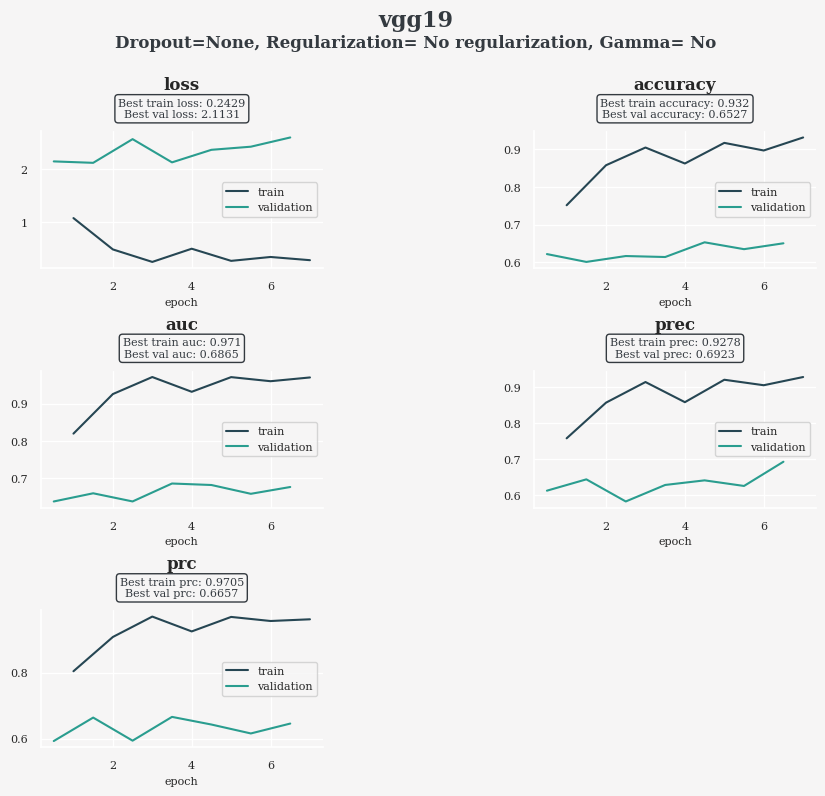

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.62      0.75      0.68       189
           1       0.69      0.56      0.62       194

    accuracy                           0.65       383
   macro avg       0.66      0.65      0.65       383
weighted avg       0.66      0.65      0.65       383



<ipython-input-14-37803451a9e4>:185: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-14-37803451a9e4>:186: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


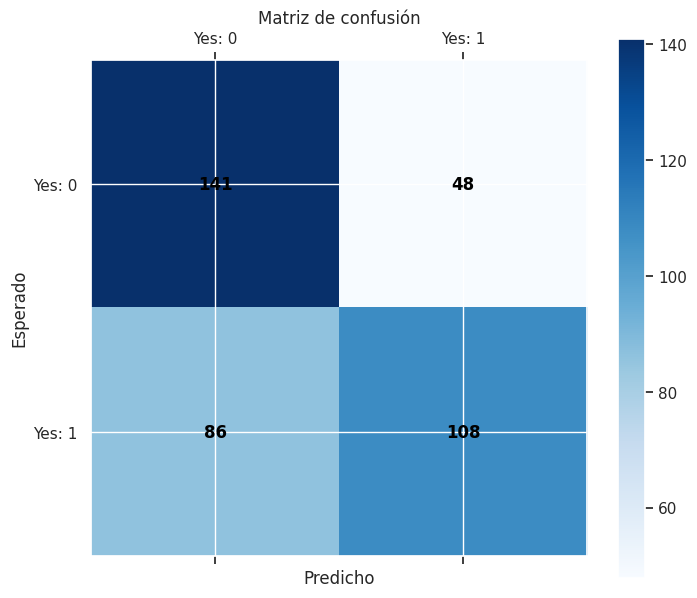


-----------------------------------
Eyes image prediction samples
-----------------------------------


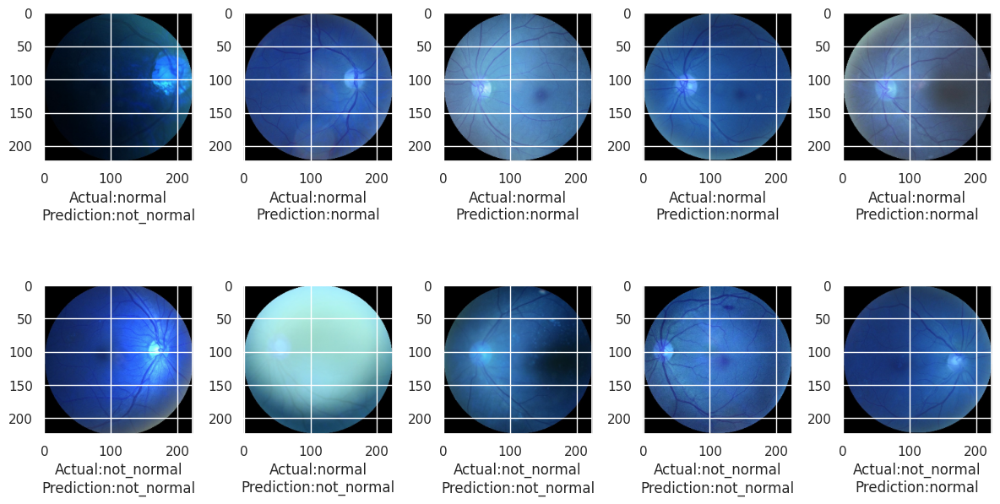

In [ ]:
history_3, model_3 = execute_model(dataset_normal, "normal_vs_rest", "vgg19","not_normal", "normal", False, 0.5)

In [ ]:
history_4, model_4 = execute_model(dataset_normal, "normal_vs_rest", "vgg19","not_normal", "normal", True, 0.5)

--------------- Defining the model vgg19 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-13-37803451a9e4>:95: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
11 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/m

ResourceExhaustedError: ignored

#### Ejecución de modelos para Normal vs cataratas

---------------Creating the model for normal vs cataract---------------

--------------- Defining the model inception_V3 ---------------

Random search: No
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_1 (Flatten)         (None, 51200)             0         
                                                                 
 dense_1 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 870 samples, validate on 218 samples
Epoc

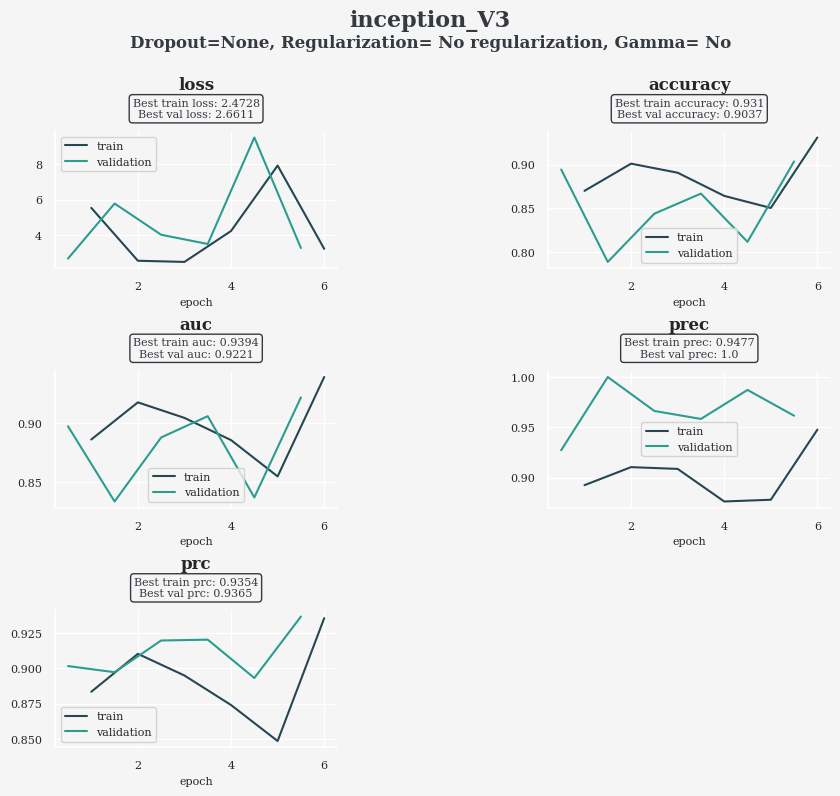

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.84      0.96      0.90       101
           1       0.96      0.85      0.90       117

    accuracy                           0.90       218
   macro avg       0.90      0.90      0.90       218
weighted avg       0.91      0.90      0.90       218



<ipython-input-16-7f78ba14e38d>:184: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-16-7f78ba14e38d>:185: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


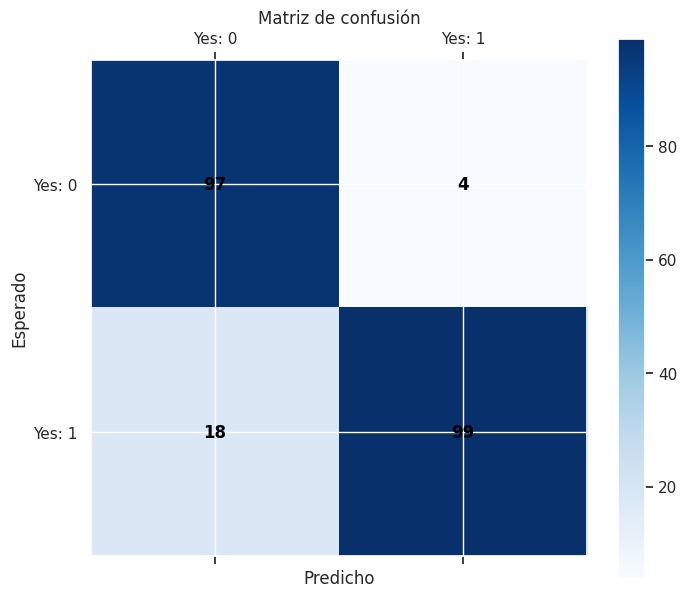


-----------------------------------
Eyes image prediction samples
-----------------------------------


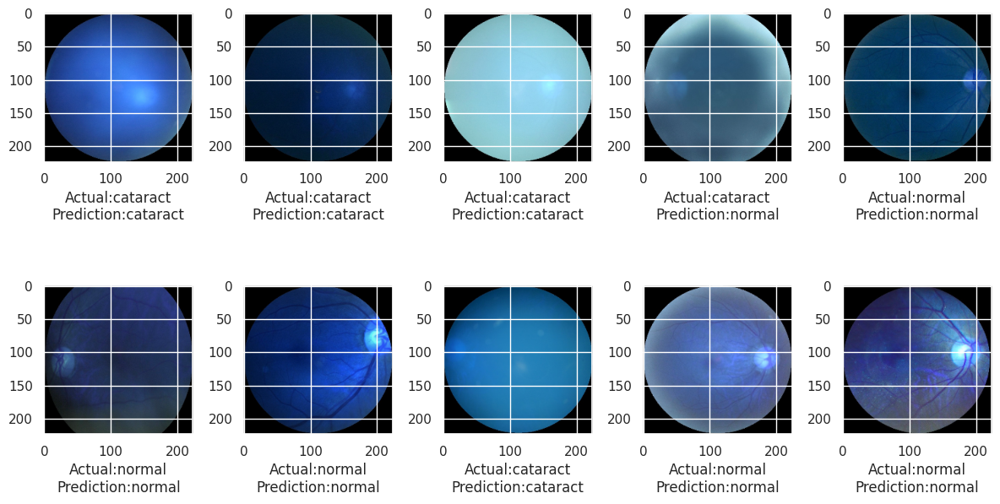

In [ ]:
print("---------------Creating the model for normal vs cataract---------------\n")
history_5, model_5 = execute_model(dataset_cataract, "normal_vs_cataract", "inception_V3", "normal", "cataract", False, 0.7)

---------------Creating the model for normal vs cataract---------------

--------------- Defining the model inception_V3 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-16-7f78ba14e38d>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_3 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_1 (Dropout)         (None, 51200)             0         
                                                                 
 dense_5 (Dense)             (None, 64)                3276864   
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 25,079,713
Trainable params: 3,276,929
Non-trainable params: 21,802,784
_________________________________________________________________
Train on 870 samples
870/870 [====

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.90367, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_cataract.h5
870/870 [==============================] - 13s 15ms/sample - loss: 14.8939 - accuracy: 0.8092 - auc: 0.8135 - prec: 0.8280 - prc: 0.8026 - val_loss: 7.8906 - val_accuracy: 0.9037 - val_auc: 0.9108 - val_prec: 0.9035 - val_prc: 0.8969
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 7.7050 - accuracy: 0.8750 - auc: 0.8858 - prec: 0.8872 - prc: 0.8779
Epoch 2: val_accuracy did not improve from 0.90367
870/870 [==============================] - 3s 3ms/sample - loss: 7.6572 - accuracy: 0.8759 - auc: 0.8866 - prec: 0.8879 - prc: 0.8786 - val_loss: 13.7029 - val_accuracy: 0.8211 - val_auc: 0.8384 - val_prec: 0.9405 - val_prc: 0.8656
Epoch 3/30
864/870 [============================>.] - ETA: 0s - loss: 6.3581 - accuracy: 0.9005 - auc: 0.9107 - prec: 0.9251 - prc: 0.9067
Epoch 3: val_acc

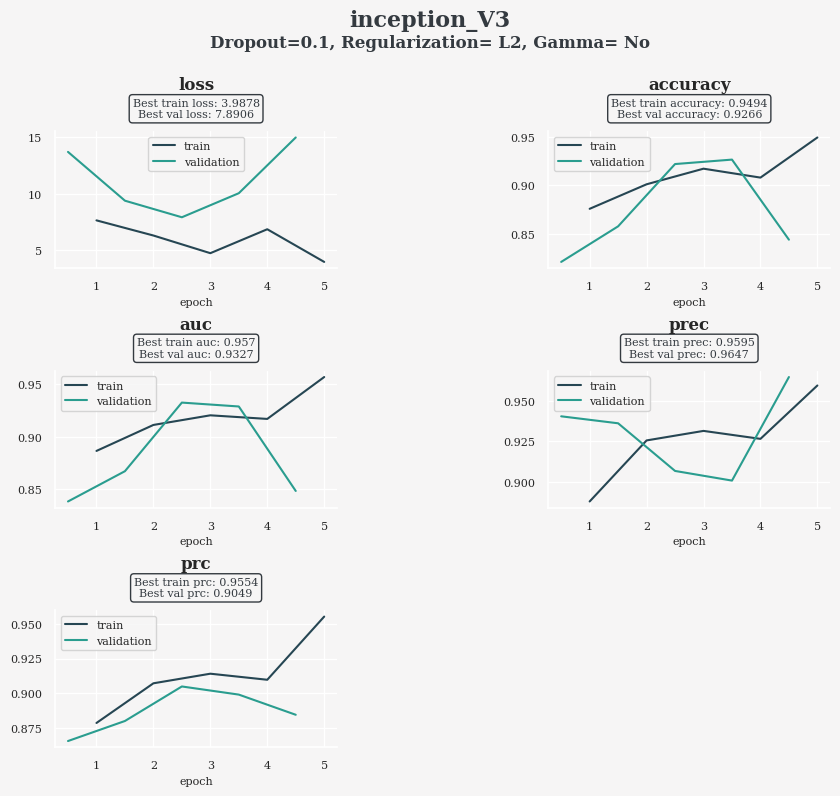

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.77      0.97      0.86       105
           1       0.96      0.73      0.83       113

    accuracy                           0.84       218
   macro avg       0.87      0.85      0.84       218
weighted avg       0.87      0.84      0.84       218



<ipython-input-16-7f78ba14e38d>:184: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-16-7f78ba14e38d>:185: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


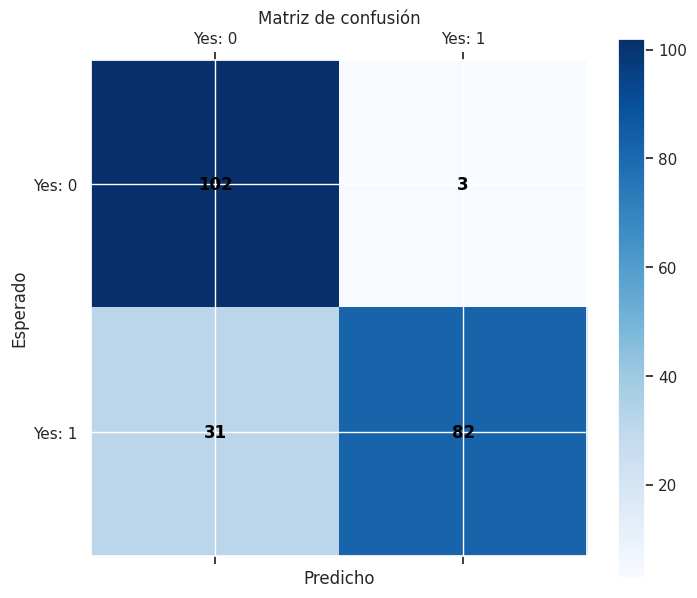


-----------------------------------
Eyes image prediction samples
-----------------------------------


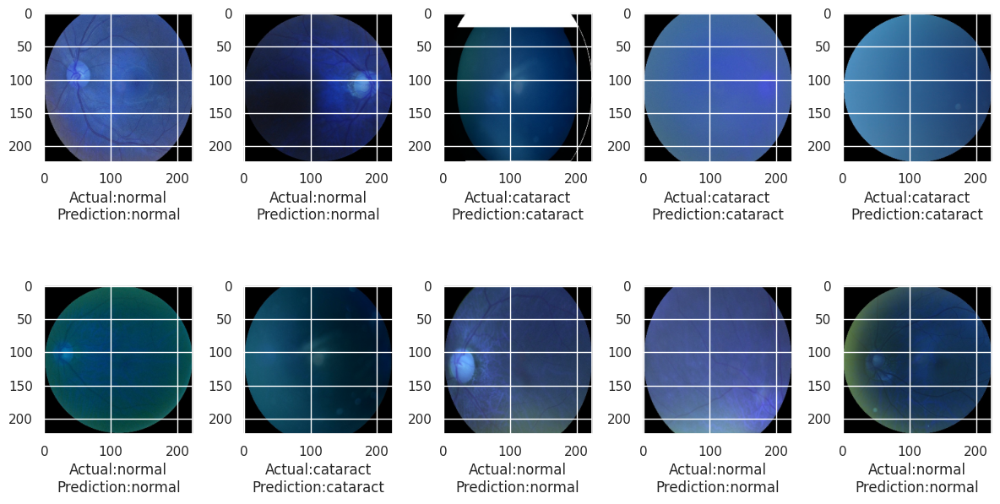

In [ ]:
print("---------------Creating the model for normal vs cataract---------------\n")
history_6, model_6 = execute_model(dataset_cataract, "normal_vs_cataract", "inception_V3", "normal", "cataract", True, 0.7)

In [ ]:
model_6.layers[-2].get_weights()
# model_6.layers[-2].name
# # array = np.ones(10, dtype=float)
# # ok=0
# for ele in model_6.layers[-2].get_weights()[0]:
#   print(ele)
#   if ele == 1.0:
#     # print("ok")
#     # print(ok)
#     ok = ok + 1

# if ok == len(model_6.layers[-1].get_weights()[0]):
#   print("SI")

# layer = model.layers[0]  # Retrieve the desired layer
# bias_initializer = layer.bias_initializer
# bias_value = bias_initializer.numpy()[0]  # Access the constant value

[array([[-4.16369596e-03, -6.71678921e-03,  4.77009280e-07, ...,
          8.61017907e-04,  2.29784258e-04,  5.73126413e-03],
        [-5.93373031e-08, -9.39220683e-08,  1.57889701e-08, ...,
          2.35297775e-04,  6.51059745e-05,  2.63099675e-03],
        [ 1.12979436e-07,  3.97370883e-08,  1.28079236e-09, ...,
         -2.31875014e-03,  1.74533616e-05, -1.65815244e-03],
        ...,
        [ 1.81172084e-07, -5.15177589e-09,  9.83488775e-08, ...,
         -1.21010107e-03, -4.85208766e-05, -3.60651931e-04],
        [ 2.01042489e-08,  2.28145574e-08, -3.59918531e-08, ...,
          6.47009415e-08,  9.46360075e-08, -1.10970966e-07],
        [ 3.40664457e-08, -5.48475541e-08,  6.86035690e-08, ...,
         -4.69204225e-03, -5.52063739e-07, -1.21676410e-03]], dtype=float32),
 array([-0.01093057, -0.01098644, -0.01097846, -0.01098713, -0.00111329,
        -0.01107601, -0.01098741, -0.01773285, -0.01098169, -0.01098912,
         0.01093584, -0.00175821, -0.01098857, -0.00819766, -0.01098

In [ ]:
# ok = np.count_nonzero(model_6.layers[-2].get_weights()[0] == 1.0)
# print(ok)


---------------Creating the model for normal vs cataract---------------

--------------- Defining the model vgg19 ---------------

Random search: No
80134624/80134624 [==============================] - 5s 0us/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dense_7 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.95413, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_cataract.h5
870/870 [==============================] - 25s 28ms/sample - loss: 1.1072 - accuracy: 0.9092 - auc: 0.9379 - prec: 0.9232 - prc: 0.9320 - val_loss: 0.6689 - val_accuracy: 0.9541 - val_auc: 0.9596 - val_prec: 0.9449 - val_prc: 0.9524
Epoch 2/30
870/870 [==============================] - ETA: 0s - loss: 0.2758 - accuracy: 0.9575 - auc: 0.9758 - prec: 0.9693 - prc: 0.9721
Epoch 2: val_accuracy did not improve from 0.95413
870/870 [==============================] - 6s 6ms/sample - loss: 0.2758 - accuracy: 0.9575 - auc: 0.9758 - prec: 0.9693 - prc: 0.9721 - val_loss: 0.4779 - val_accuracy: 0.9495 - val_auc: 0.9631 - val_prec: 0.9375 - val_prc: 0.9498
Epoch 3/30
870/870 [==============================] - ETA: 0s - loss: 0.1460 - accuracy: 0.9759 - auc: 0.9879 - prec: 0.9744 - prc: 0.9886
Epoch 3: val_accuracy imp

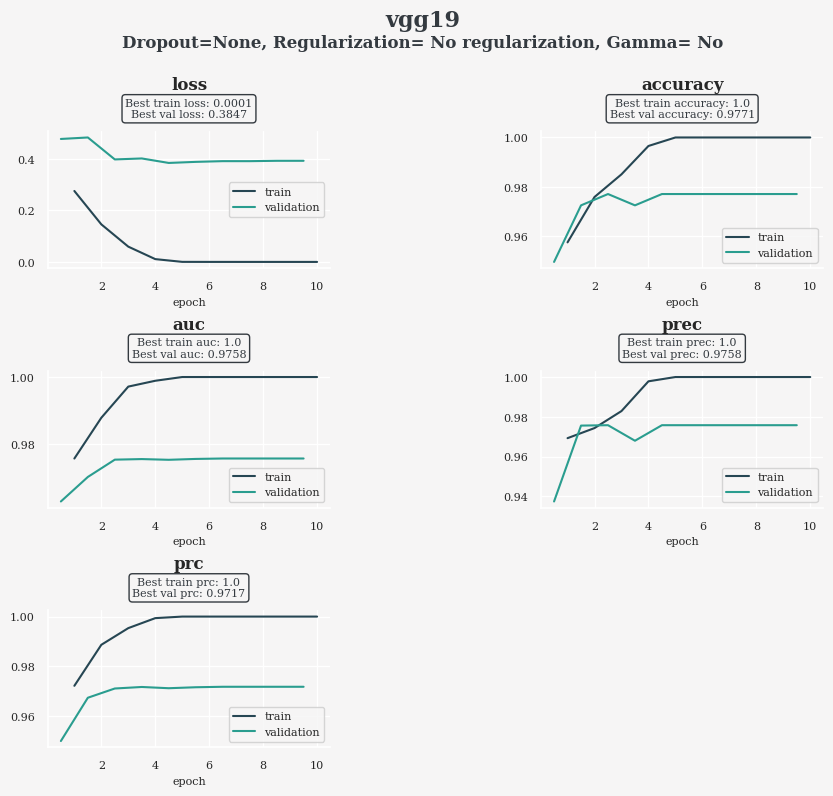

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.98      0.97      0.97        95
           1       0.98      0.98      0.98       123

    accuracy                           0.98       218
   macro avg       0.98      0.98      0.98       218
weighted avg       0.98      0.98      0.98       218



<ipython-input-16-7f78ba14e38d>:184: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-16-7f78ba14e38d>:185: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


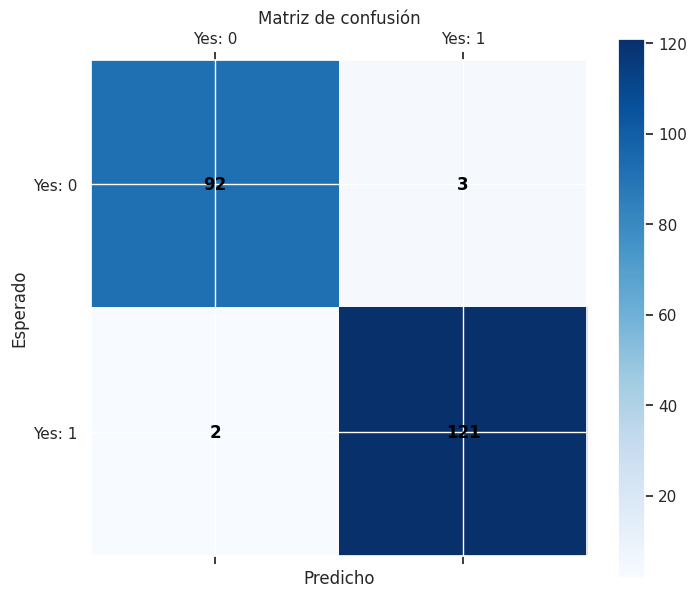


-----------------------------------
Eyes image prediction samples
-----------------------------------


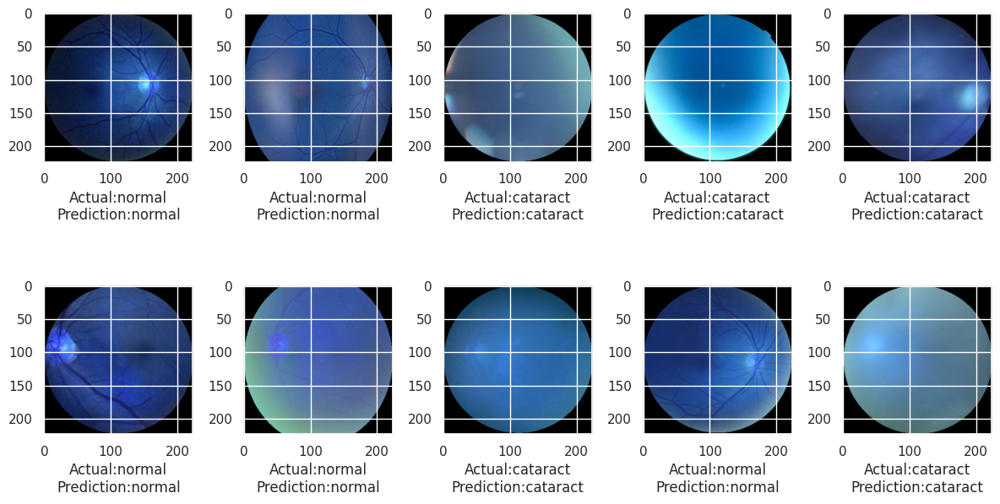

In [ ]:
print("---------------Creating the model for normal vs cataract---------------\n")
history_7, model_7 = execute_model(dataset_cataract, "normal_vs_cataract", "vgg19", "normal", "cataract", False, 0.7)

--------------- Defining the model vgg19 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-11-d6fc586719cd>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below ar

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dropout (Dropout)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 64)                1605696   
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 21,630,145
Trainable params: 1,605,761
Non-trainable params: 20,024,384
_________________________________________________________________
Train on 870 samples
870/870 [======

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.94037, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_cataract.h5
870/870 [==============================] - 12s 14ms/sample - loss: 1.5187 - accuracy: 0.8897 - auc: 0.9174 - prec: 0.9059 - prc: 0.9182 - val_loss: 0.7474 - val_accuracy: 0.9404 - val_auc: 0.9461 - val_prec: 0.9219 - val_prc: 0.9241
Epoch 2/30
870/870 [==============================] - ETA: 0s - loss: 0.4013 - accuracy: 0.9552 - auc: 0.9763 - prec: 0.9612 - prc: 0.9706
Epoch 2: val_accuracy improved from 0.94037 to 0.94495, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_cataract.h5
870/870 [==============================] - 5s 6ms/sample - loss: 0.4013 - accuracy: 0.9552 - auc: 0.9763 - prec: 0.9612 - prc: 0.9706 - val_loss: 0.3452 - val_accuracy: 0.9450 - val_auc: 0.9801 - val_prec: 0.9658 - val_prc: 0.9805
Epoch 3/30
870/870 [===========

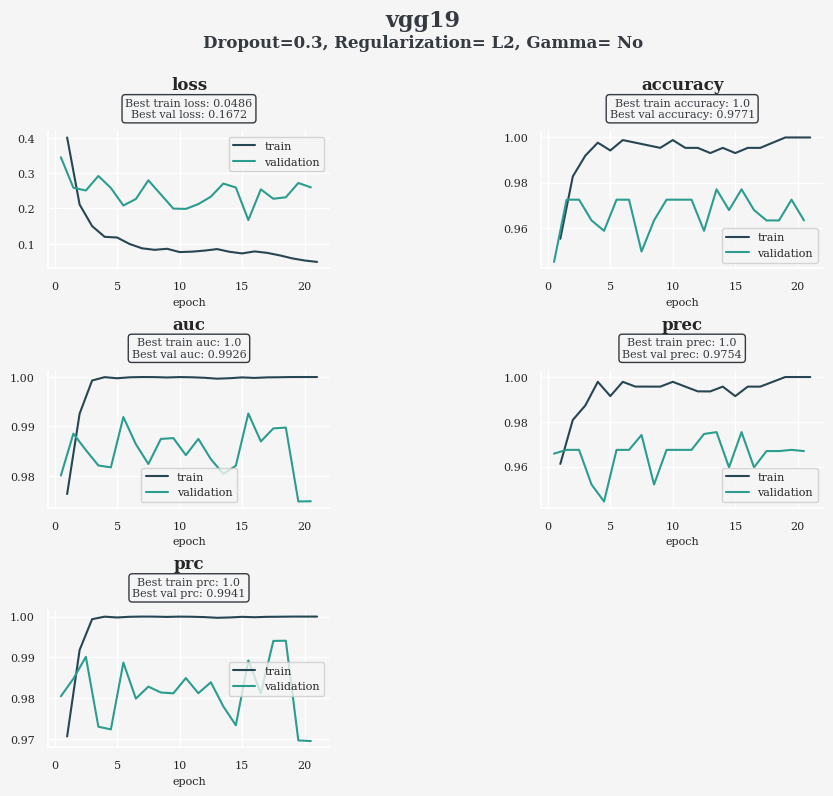

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.96      0.96      0.96        97
           1       0.97      0.97      0.97       121

    accuracy                           0.96       218
   macro avg       0.96      0.96      0.96       218
weighted avg       0.96      0.96      0.96       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


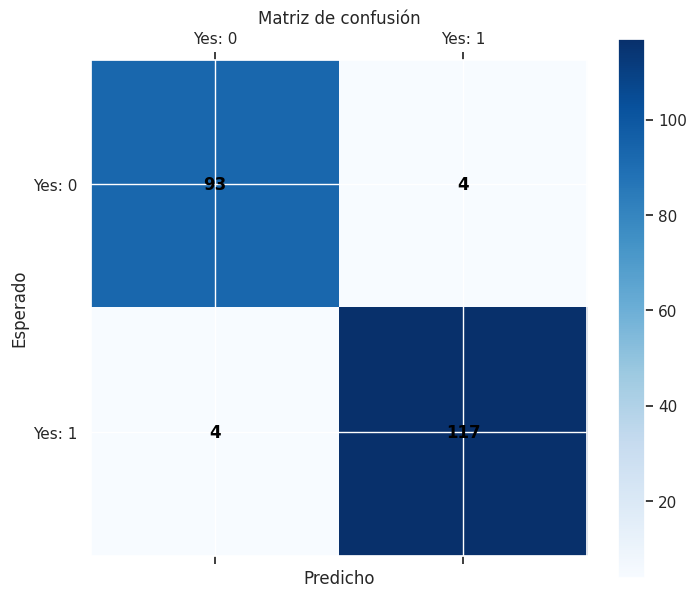


-----------------------------------
Eyes image prediction samples
-----------------------------------


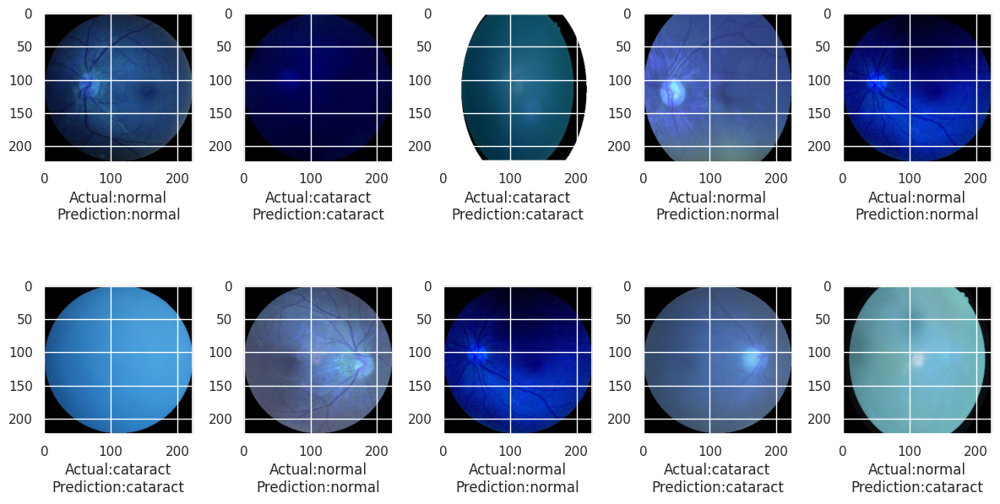

In [ ]:
history_8, model_8 = execute_model(dataset_cataract, "normal_vs_cataract", "vgg19","normal", "cataract", True, 0.7)

#### Ejecución de modelos para Normal vs diabetes

Instructions for updating:
Colocations handled automatically by placer.


---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model inception_V3 ---------------

Random search: No
87910968/87910968 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_1 (Flatten)         (None, 51200)             0         
                                                                 
 dense_2 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model--

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.75229, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_diabetes.h5
870/870 [==============================] - 11s 13ms/sample - loss: 20.4349 - accuracy: 0.7276 - auc: 0.7406 - prec: 0.7537 - prc: 0.7426 - val_loss: 11.8488 - val_accuracy: 0.7523 - val_auc: 0.7580 - val_prec: 0.9242 - val_prc: 0.7971
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 5.7815 - accuracy: 0.8657 - auc: 0.8768 - prec: 0.9050 - prc: 0.8798
Epoch 2: val_accuracy improved from 0.75229 to 0.78899, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_diabetes.h5
870/870 [==============================] - 3s 3ms/sample - loss: 5.7417 - accuracy: 0.8667 - auc: 0.8777 - prec: 0.9058 - prc: 0.8809 - val_loss: 8.7638 - val_accuracy: 0.7890 - val_auc: 0.8151 - val_prec: 0.7192 - val_prc: 0.7390
Epoch 3/30
864/

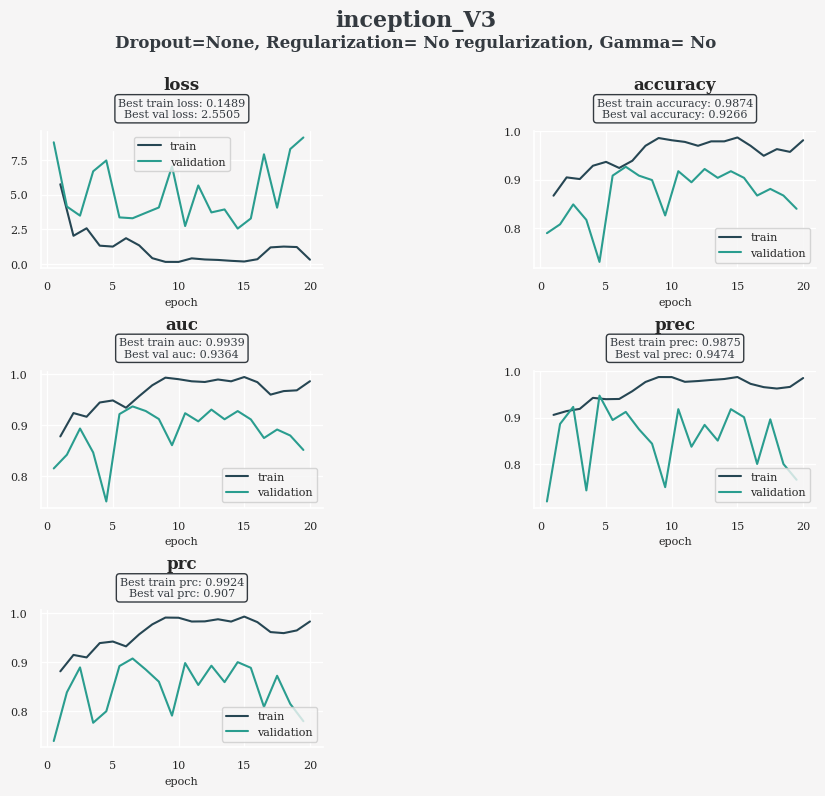

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.97      0.69      0.81       108
           1       0.77      0.98      0.86       110

    accuracy                           0.84       218
   macro avg       0.87      0.84      0.84       218
weighted avg       0.87      0.84      0.84       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


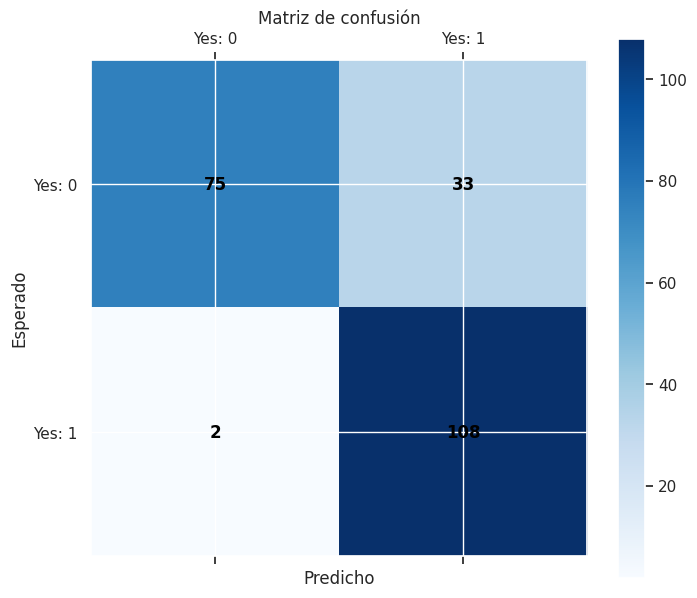


-----------------------------------
Eyes image prediction samples
-----------------------------------


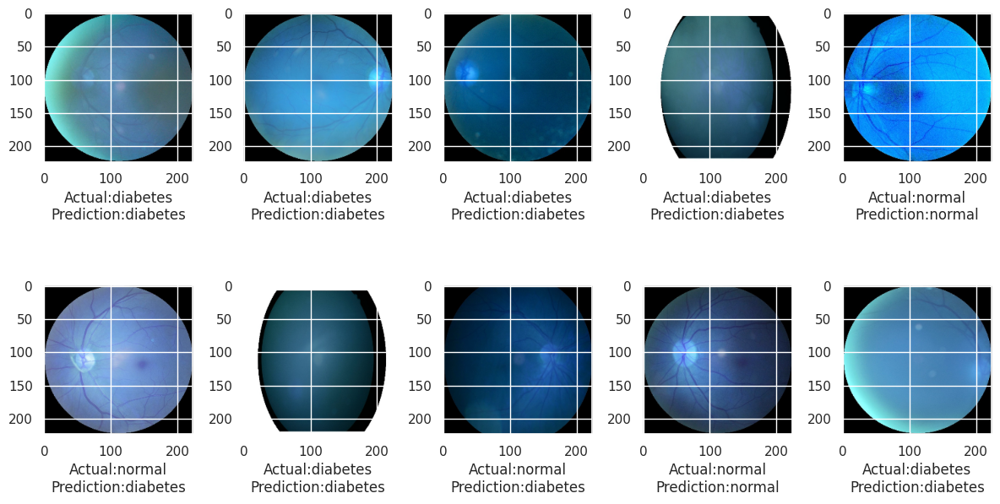

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_9, model_9 = execute_model(dataset_cataract, "normal_vs_diabetes", "inception_V3", "normal", "diabetes", False, 0.6)

---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model vgg19 ---------------

Random search: No
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_2 (Flatten)         (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 870 samples, validate on 218 samples
Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.95413, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_diabetes.h5
870/870 [==============================] - 8s 9ms/sample - loss: 1.9029 - accuracy: 0.8632 - auc: 0.8965 - prec: 0.8827 - prc: 0.8795 - val_loss: 0.7543 - val_accuracy: 0.9541 - val_auc: 0.9625 - val_prec: 0.9717 - val_prc: 0.9642
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 0.3525 - accuracy: 0.9583 - auc: 0.9765 - prec: 0.9563 - prc: 0.9701
Epoch 2: val_accuracy did not improve from 0.95413
870/870 [==============================] - 5s 6ms/sample - loss: 0.3648 - accuracy: 0.9575 - auc: 0.9756 - prec: 0.9565 - prc: 0.9697 - val_loss: 0.4993 - val_accuracy: 0.9404 - val_auc: 0.9709 - val_prec: 0.9899 - val_prc: 0.9814
Epoch 3/30
864/870 [============================>.] - ETA: 0s - loss: 0.1297 - accuracy: 0.9676 - auc: 0.9899 - prec: 0.9745 - prc: 0.9882
Epoch 3: val_accuracy did n

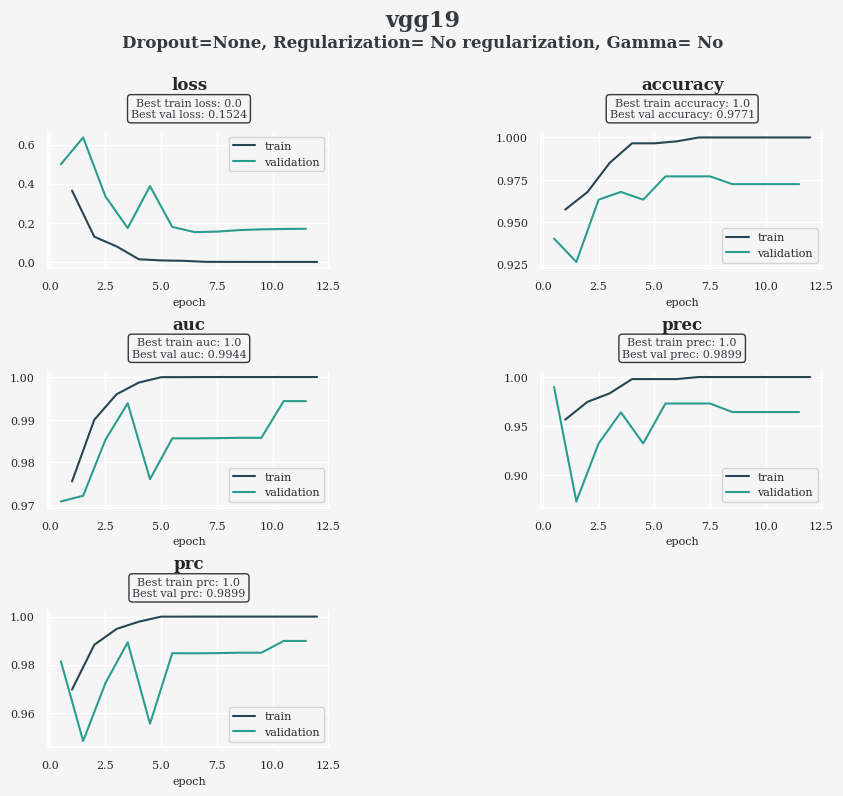

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       108
           1       0.96      0.98      0.97       110

    accuracy                           0.97       218
   macro avg       0.97      0.97      0.97       218
weighted avg       0.97      0.97      0.97       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


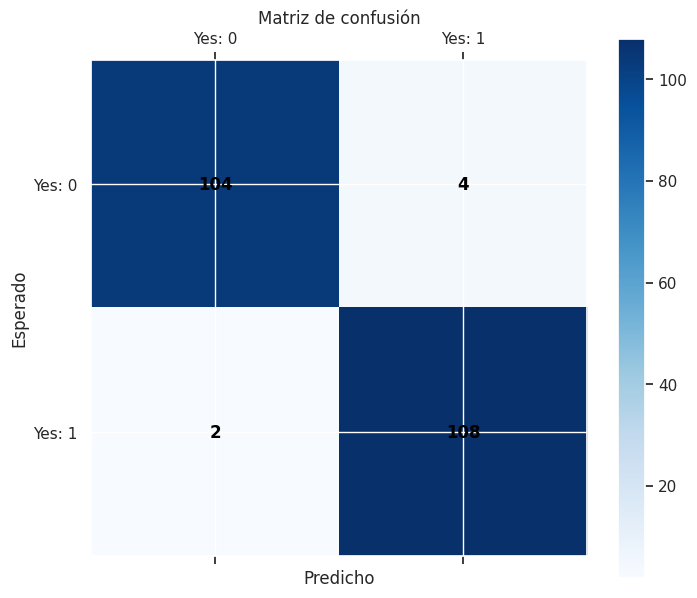


-----------------------------------
Eyes image prediction samples
-----------------------------------


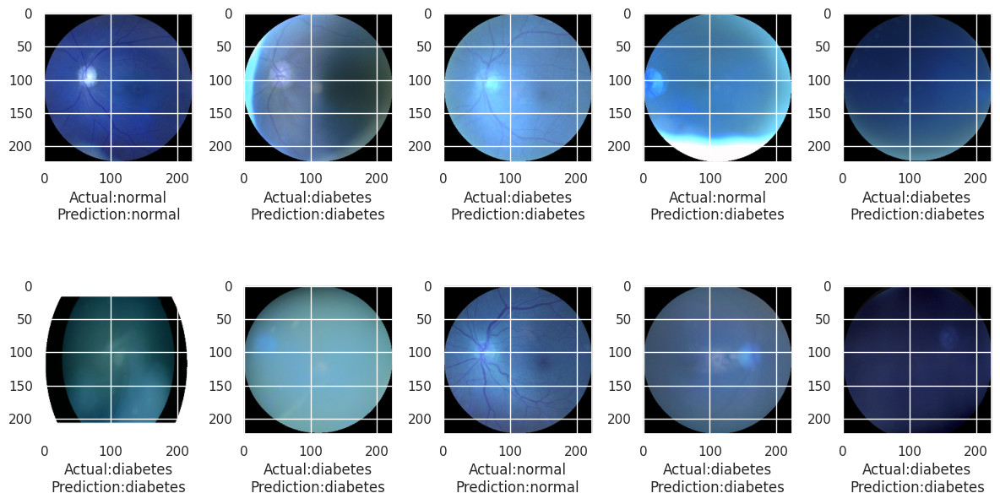

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_10, model_10 = execute_model(dataset_cataract, "normal_vs_diabetes", "vgg19", "normal", "diabetes", False, 0.6)

---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model inception_V3 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-11-d6fc586719cd>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
7 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/mo

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_3 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_1 (Dropout)         (None, 51200)             0         
                                                                 
 dense_4 (Dense)             (None, 64)                3276864   
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 25,079,713
Trainable params: 3,276,929
Non-trainable params: 21,802,784
_________________________________________________________________
Train on 870 samples
870/870 [====

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.74312, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_diabetes.h5
870/870 [==============================] - 9s 11ms/sample - loss: 27.4446 - accuracy: 0.7575 - auc: 0.7624 - prec: 0.7837 - prc: 0.7526 - val_loss: 35.1805 - val_accuracy: 0.7431 - val_auc: 0.7324 - val_prec: 0.6951 - val_prc: 0.6979
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 13.5931 - accuracy: 0.8368 - auc: 0.8378 - prec: 0.8410 - prc: 0.8187
Epoch 2: val_accuracy did not improve from 0.74312
870/870 [==============================] - 3s 3ms/sample - loss: 13.5856 - accuracy: 0.8368 - auc: 0.8380 - prec: 0.8410 - prc: 0.8181 - val_loss: 12.8131 - val_accuracy: 0.7064 - val_auc: 0.7634 - val_prec: 0.9242 - val_prc: 0.8189
Epoch 3/30
864/870 [============================>.] - ETA: 0s - loss: 3.0572 - accuracy: 0.8947 - auc: 0.9128 - prec: 0.9156 - prc: 0.9082
Epoch 3: val_a

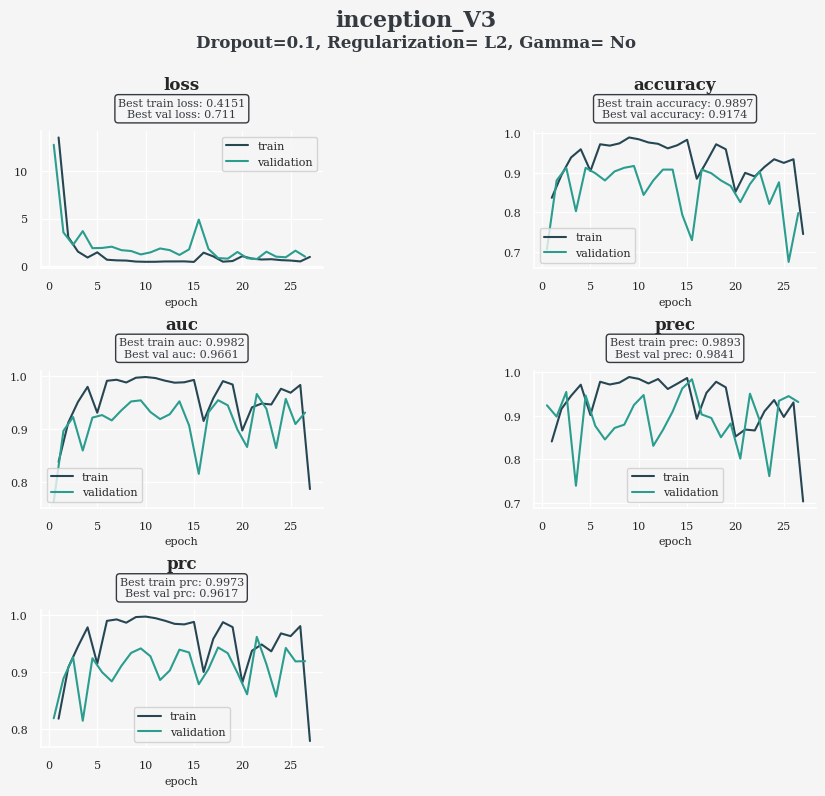

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.45      1.00      0.62        98
           1       1.00      0.01      0.02       120

    accuracy                           0.45       218
   macro avg       0.73      0.50      0.32       218
weighted avg       0.75      0.45      0.29       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


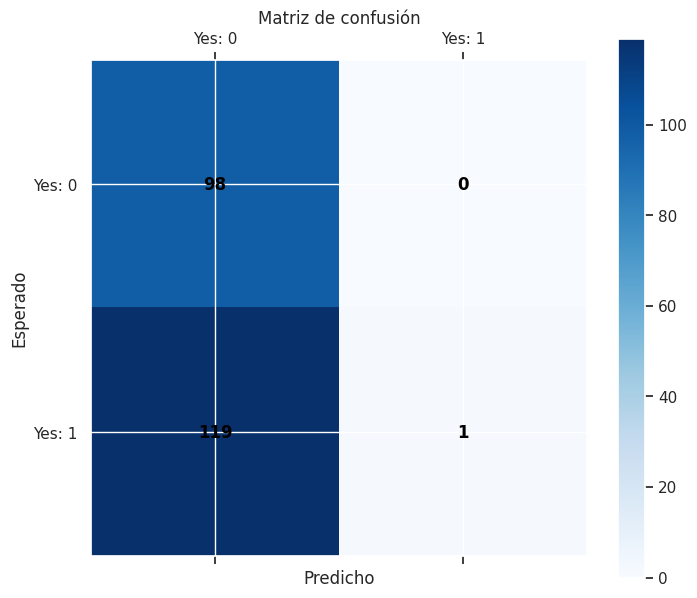


-----------------------------------
Eyes image prediction samples
-----------------------------------


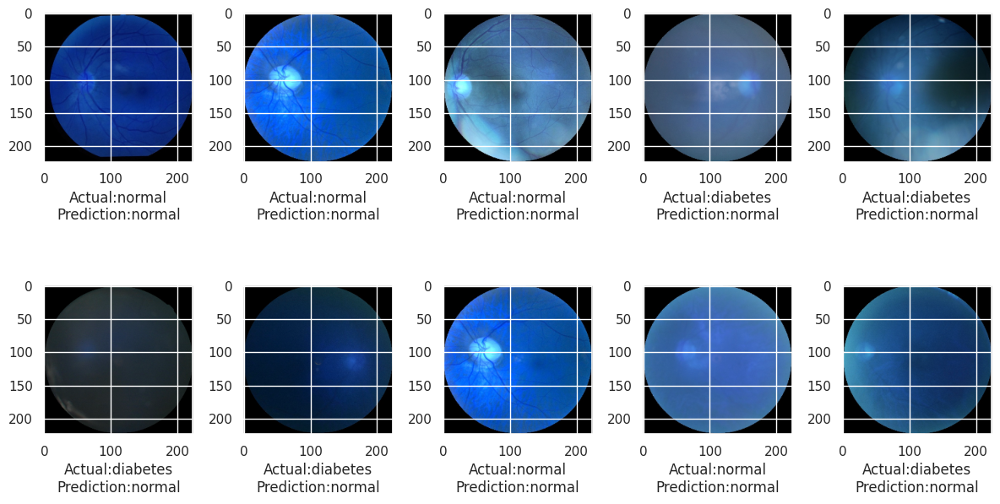

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_11, model_11 = execute_model(dataset_cataract, "normal_vs_diabetes", "inception_V3", "normal", "diabetes", True, 0.6)

---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model vgg19 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-11-d6fc586719cd>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below ar

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_4 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_2 (Dropout)         (None, 25088)             0         
                                                                 
 dense_6 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
Train on 870 samples
870/870 [==============================] - 4s 5ms/sample - loss: 1.7118 - accuracy: 0.8655 - auc: 0.8985 - prec: 0.8834 - prc: 0.8899
--------------

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.91743, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_diabetes.h5
870/870 [==============================] - 10s 11ms/sample - loss: 0.7878 - accuracy: 0.9402 - auc: 0.9526 - prec: 0.9449 - prc: 0.9470 - val_loss: 0.8498 - val_accuracy: 0.9174 - val_auc: 0.9353 - val_prec: 0.9083 - val_prc: 0.9234
Epoch 2/30
870/870 [==============================] - ETA: 0s - loss: 0.3250 - accuracy: 0.9632 - auc: 0.9768 - prec: 0.9681 - prc: 0.9753
Epoch 2: val_accuracy improved from 0.91743 to 0.95413, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_diabetes.h5
870/870 [==============================] - 5s 6ms/sample - loss: 0.3250 - accuracy: 0.9632 - auc: 0.9768 - prec: 0.9681 - prc: 0.9753 - val_loss: 0.7470 - val_accuracy: 0.9541 - val_auc: 0.9565 - val_prec: 0.9492 - val_prc: 0.9462
Epoch 3/30
870/870 [===========

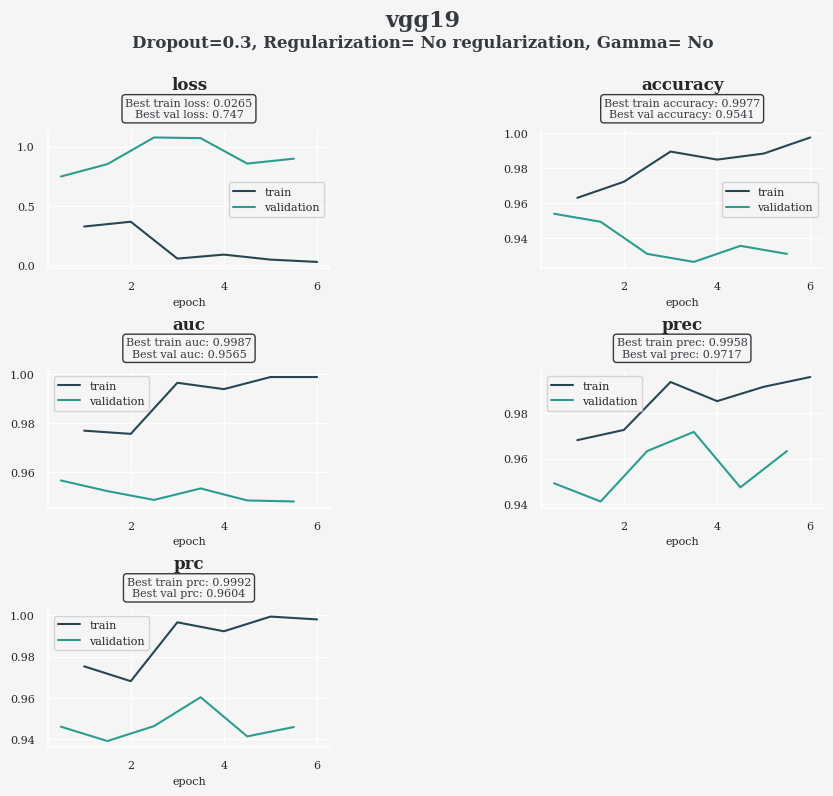

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       102
           1       0.96      0.91      0.93       116

    accuracy                           0.93       218
   macro avg       0.93      0.93      0.93       218
weighted avg       0.93      0.93      0.93       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


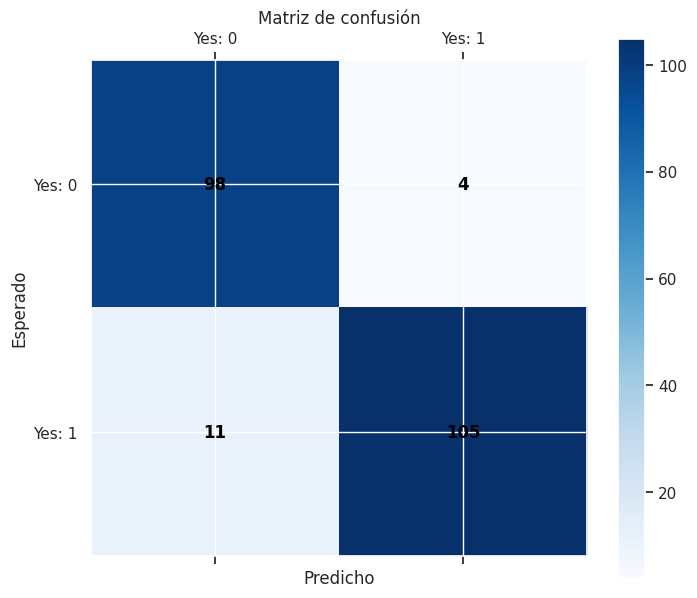


-----------------------------------
Eyes image prediction samples
-----------------------------------


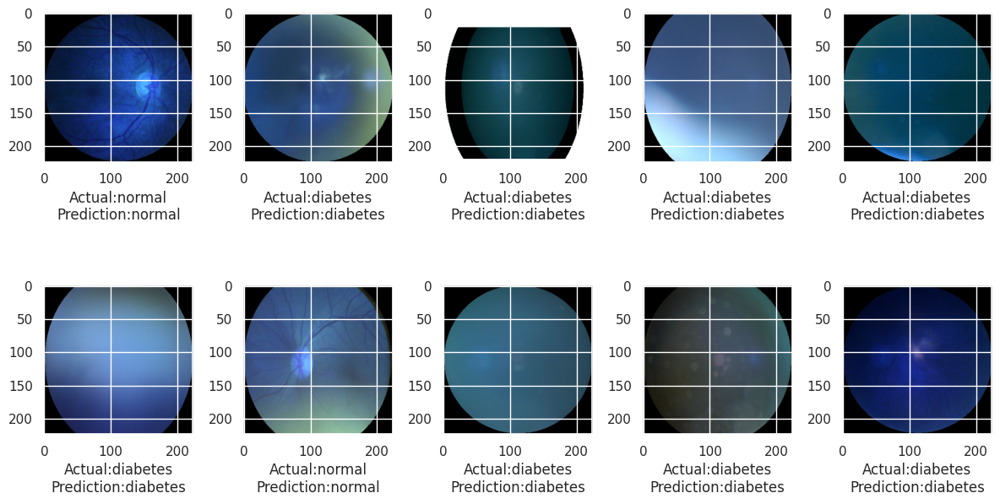

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_12, model_12 = execute_model(dataset_cataract, "normal_vs_diabetes", "vgg19", "normal", "diabetes", True, 0.6)

#### Ejecución de modelos para Normal vs glaucoma

---------------Creating the model for normal vs glaucoma---------------

--------------- Defining the model inception_V3 ---------------

Random search: No
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_5 (Flatten)         (None, 51200)             0         
                                                                 
 dense_7 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 870 samples, validate on 218 samples
Epoc

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.83945, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_glaucoma.h5
870/870 [==============================] - 11s 13ms/sample - loss: 21.0907 - accuracy: 0.7092 - auc: 0.7090 - prec: 0.7434 - prc: 0.7073 - val_loss: 4.6878 - val_accuracy: 0.8394 - val_auc: 0.8540 - val_prec: 0.8077 - val_prc: 0.8107
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 3.7441 - accuracy: 0.8657 - auc: 0.8865 - prec: 0.8845 - prc: 0.8792
Epoch 2: val_accuracy improved from 0.83945 to 0.85780, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_glaucoma.h5
870/870 [==============================] - 3s 3ms/sample - loss: 3.7247 - accuracy: 0.8655 - auc: 0.8860 - prec: 0.8836 - prc: 0.8784 - val_loss: 2.6730 - val_accuracy: 0.8578 - val_auc: 0.9023 - val_prec: 0.9286 - val_prc: 0.9082
Epoch 3/30
864/8

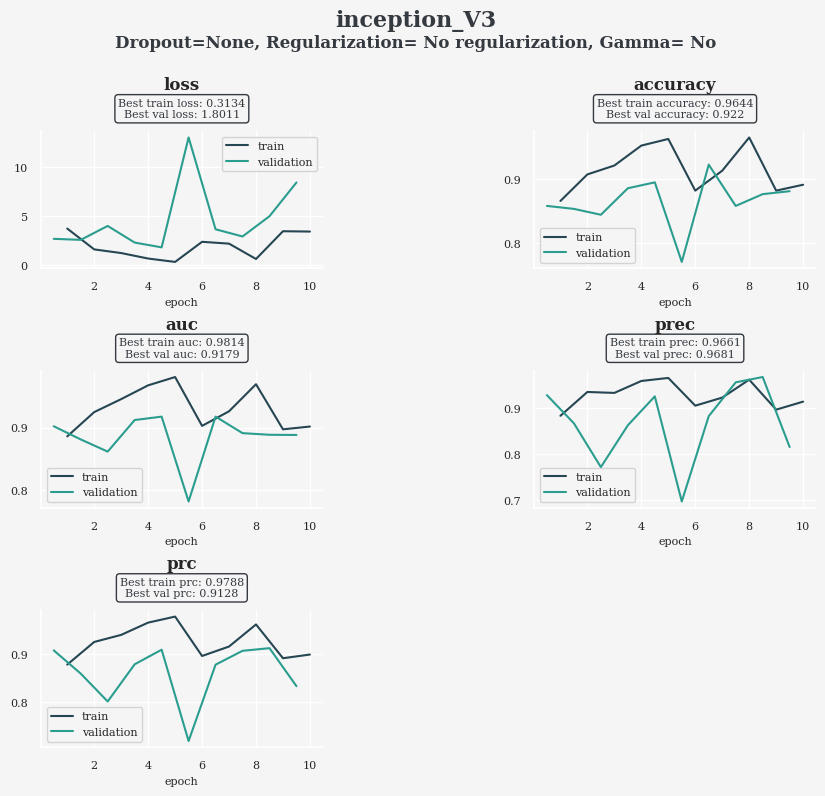

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       1.00      0.75      0.86       103
           1       0.82      1.00      0.90       115

    accuracy                           0.88       218
   macro avg       0.91      0.87      0.88       218
weighted avg       0.90      0.88      0.88       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


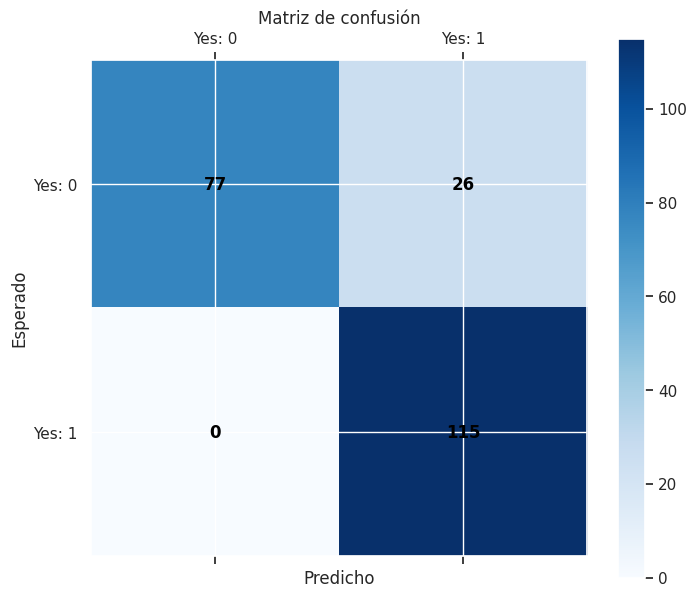


-----------------------------------
Eyes image prediction samples
-----------------------------------


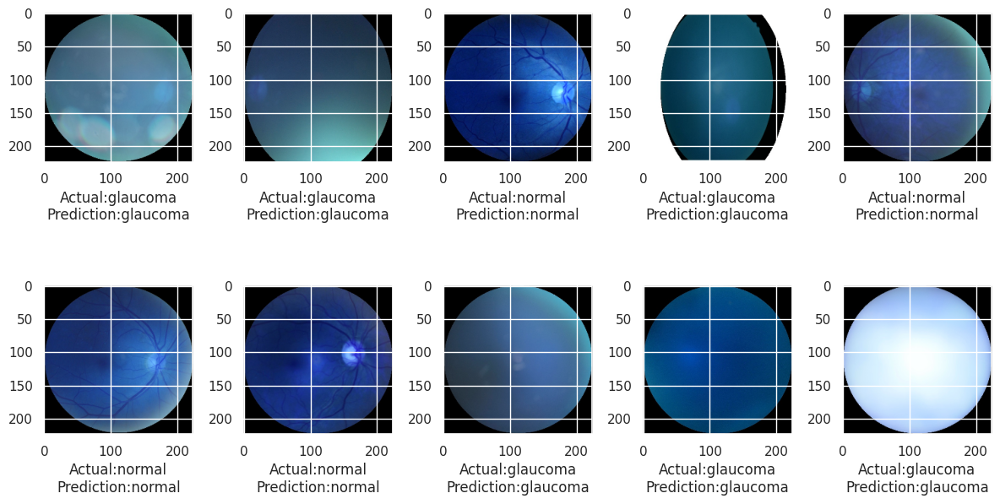

In [ ]:
print("---------------Creating the model for normal vs glaucoma---------------\n")
history_13, model_13 = execute_model(dataset_cataract, "normal_vs_glaucoma", "inception_V3", "normal", "glaucoma", False, 0.6)

---------------Creating the model for normal vs glaucoma---------------

--------------- Defining the model vgg19 ---------------

Random search: No
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_6 (Flatten)         (None, 25088)             0         
                                                                 
 dense_8 (Dense)             (None, 1)                 25089     
                                                                 
Total params: 20,049,473
Trainable params: 25,089
Non-trainable params: 20,024,384
_________________________________________________________________
---------------Define callbacks---------------

---------------Train the model---------------

Train on 870 samples, validate on 218 samples
Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.94954, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_glaucoma.h5
870/870 [==============================] - 12s 14ms/sample - loss: 1.9218 - accuracy: 0.8782 - auc: 0.9012 - prec: 0.8906 - prc: 0.8883 - val_loss: 0.9111 - val_accuracy: 0.9495 - val_auc: 0.9675 - val_prec: 0.9820 - val_prc: 0.9695
Epoch 2/30
870/870 [==============================] - ETA: 0s - loss: 0.6194 - accuracy: 0.9517 - auc: 0.9659 - prec: 0.9632 - prc: 0.9633
Epoch 2: val_accuracy did not improve from 0.94954
870/870 [==============================] - 5s 6ms/sample - loss: 0.6194 - accuracy: 0.9517 - auc: 0.9659 - prec: 0.9632 - prc: 0.9633 - val_loss: 0.6865 - val_accuracy: 0.9450 - val_auc: 0.9650 - val_prec: 0.9077 - val_prc: 0.9440
Epoch 3/30
870/870 [==============================] - ETA: 0s - loss: 0.2159 - accuracy: 0.9724 - auc: 0.9846 - prec: 0.9705 - prc: 0.9810
Epoch 3: val_accuracy imp

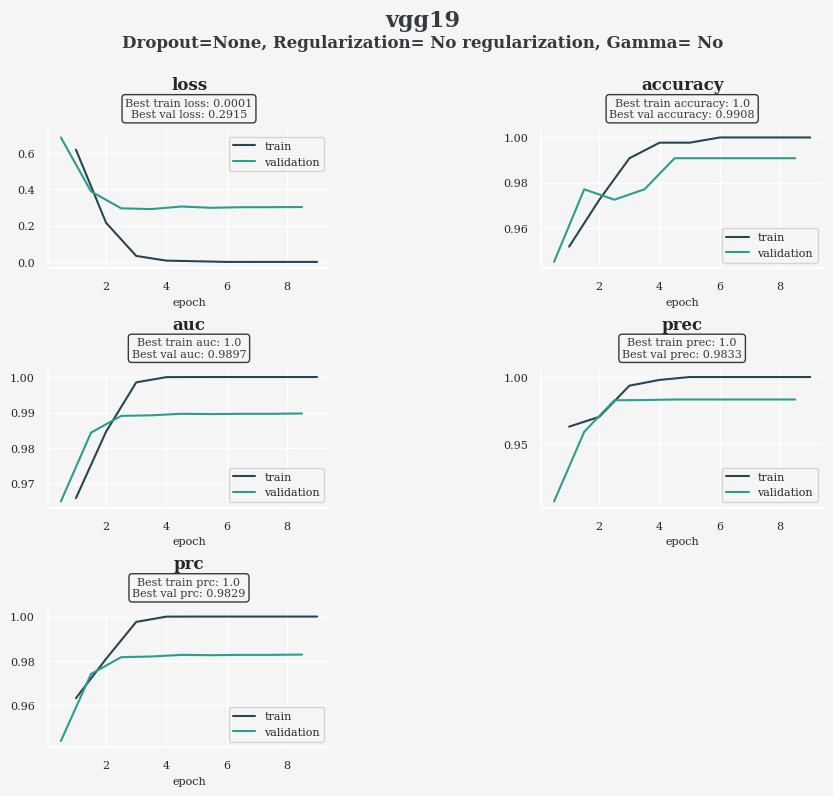

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99       100
           1       0.98      1.00      0.99       118

    accuracy                           0.99       218
   macro avg       0.99      0.99      0.99       218
weighted avg       0.99      0.99      0.99       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


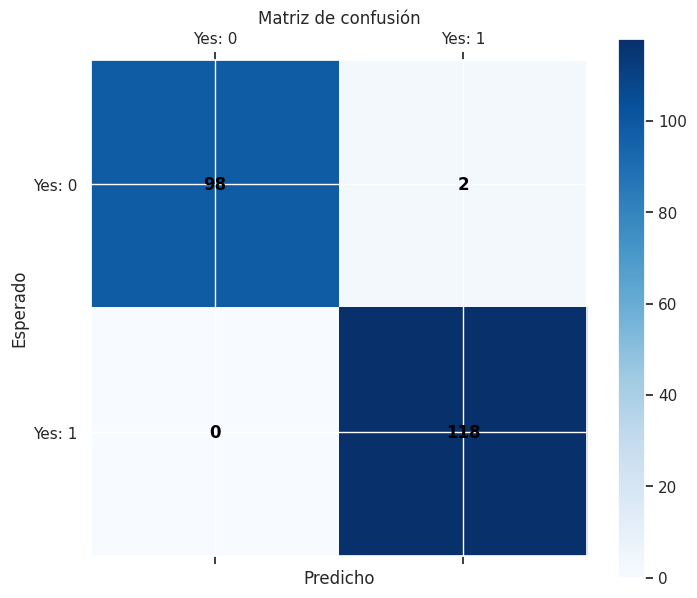


-----------------------------------
Eyes image prediction samples
-----------------------------------


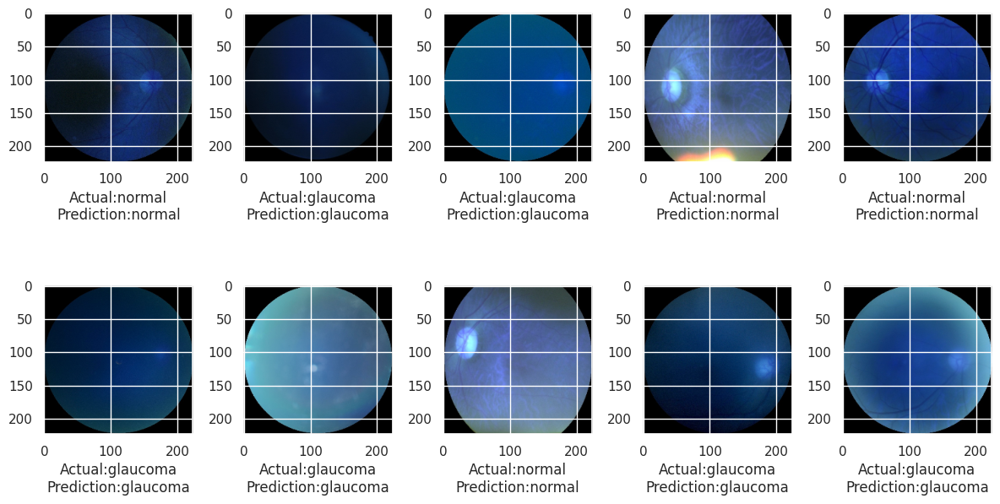

In [ ]:
print("---------------Creating the model for normal vs glaucoma---------------\n")
history_14, model_14 = execute_model(dataset_cataract, "normal_vs_glaucoma", "vgg19", "normal", "glaucoma", False, 0.6)

---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model inception_V3 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-11-d6fc586719cd>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
9 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_7 (Flatten)         (None, 51200)             0         
                                                                 
 dropout_3 (Dropout)         (None, 51200)             0         
                                                                 
 dense_9 (Dense)             (None, 1)                 51201     
                                                                 
Total params: 21,853,985
Trainable params: 51,201
Non-trainable params: 21,802,784
_________________________________________________________________
Train on 870 samples
870/870 [==============================] - 3s 4ms/sample - loss: 45.4095 - accuracy: 0.6184 - auc: 0.6195 - prec: 0.6394 - prc: 0.6212
-------------

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.88991, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/inception_V3_normal_vs_glaucoma.h5
870/870 [==============================] - 12s 14ms/sample - loss: 10.1758 - accuracy: 0.8218 - auc: 0.8313 - prec: 0.8475 - prc: 0.8176 - val_loss: 7.1715 - val_accuracy: 0.8899 - val_auc: 0.9067 - val_prec: 0.9626 - val_prc: 0.9273
Epoch 2/30
864/870 [============================>.] - ETA: 0s - loss: 5.7210 - accuracy: 0.8600 - auc: 0.8773 - prec: 0.8657 - prc: 0.8611
Epoch 2: val_accuracy did not improve from 0.88991
870/870 [==============================] - 3s 3ms/sample - loss: 5.6815 - accuracy: 0.8609 - auc: 0.8781 - prec: 0.8660 - prc: 0.8612 - val_loss: 9.8904 - val_accuracy: 0.8119 - val_auc: 0.8424 - val_prec: 0.9767 - val_prc: 0.8978
Epoch 3/30
864/870 [============================>.] - ETA: 0s - loss: 3.4252 - accuracy: 0.8970 - auc: 0.9169 - prec: 0.9292 - prc: 0.9176
Epoch 3: val_accu

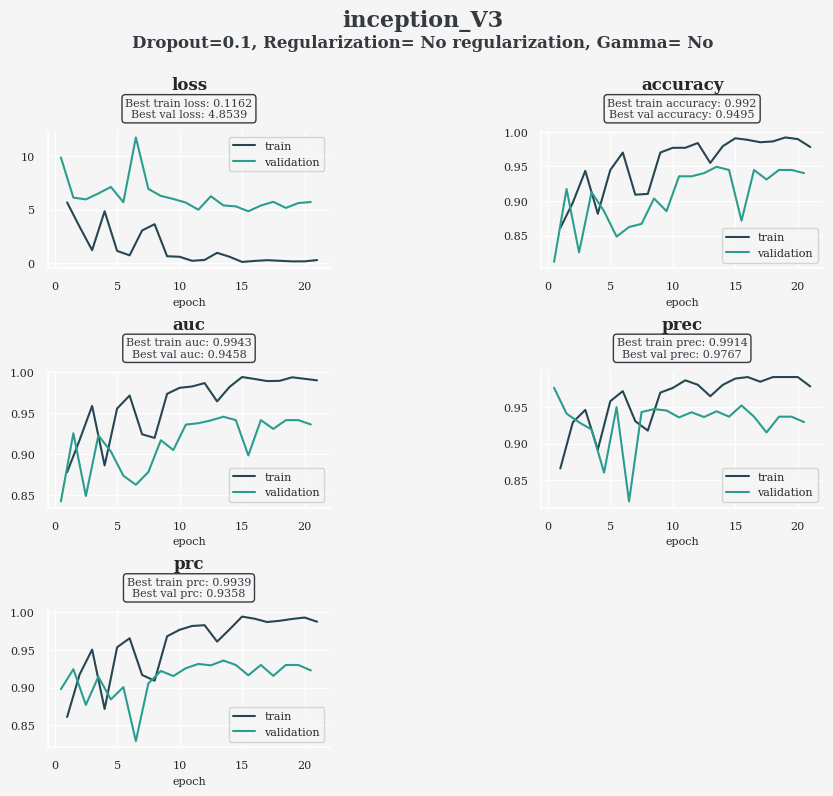

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       0.96      0.91      0.93        95
           1       0.93      0.97      0.95       123

    accuracy                           0.94       218
   macro avg       0.94      0.94      0.94       218
weighted avg       0.94      0.94      0.94       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


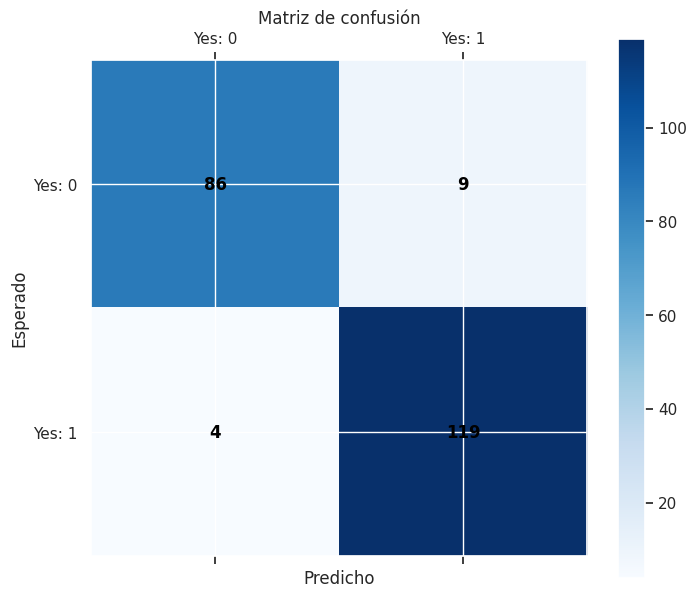


-----------------------------------
Eyes image prediction samples
-----------------------------------


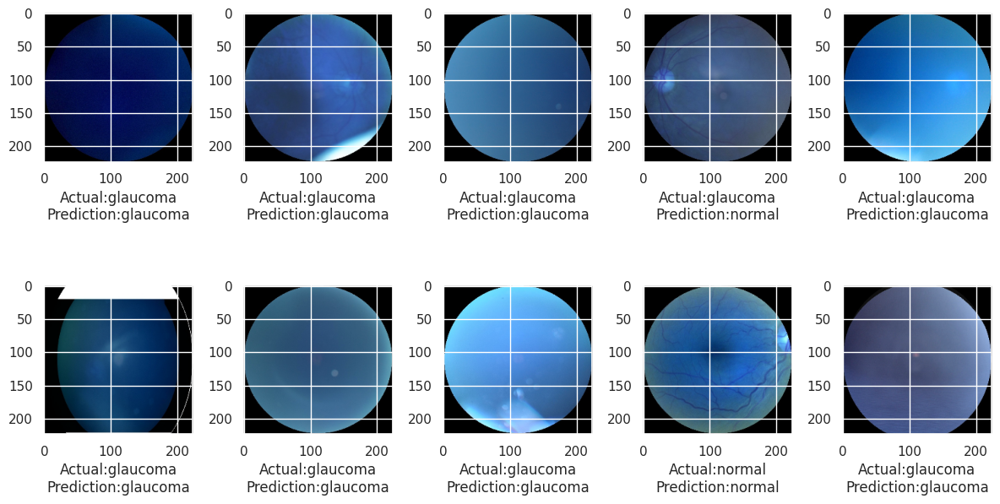

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_15, model_15 = execute_model(dataset_cataract, "normal_vs_glaucoma", "inception_V3", "normal", "glaucoma", True, 0.6)

---------------Creating the model for normal vs diabetes---------------

--------------- Defining the model vgg19 ---------------

Random search: Yes
Fitting 3 folds for each of 5 candidates, totalling 15 fits


<ipython-input-11-d6fc586719cd>:97: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  search = RandomizedSearchCV(estimator=KerasClassifier(build_fn=model_builder), param_distributions=param_grid, n_iter=5, cv=3,n_jobs = -1, verbose=1) # estudiar el rendimiento de randomizedSearch
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
11 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/m

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 flatten_8 (Flatten)         (None, 25088)             0         
                                                                 
 dropout_4 (Dropout)         (None, 25088)             0         
                                                                 
 dense_10 (Dense)            (None, 64)                1605696   
                                                                 
 dense_11 (Dense)            (None, 1)                 65        
                                                                 
Total params: 21,630,145
Trainable params: 1,605,761
Non-trainable params: 20,024,384
_________________________________________________________________
Train on 870 samples
870/870 [====

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_accuracy improved from -inf to 0.76147, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_glaucoma.h5
870/870 [==============================] - 14s 16ms/sample - loss: 2.8886 - accuracy: 0.9080 - auc: 0.9217 - prec: 0.9180 - prc: 0.9150 - val_loss: 8.3557 - val_accuracy: 0.7615 - val_auc: 0.8483 - val_prec: 0.9877 - val_prc: 0.9158
Epoch 2/30
870/870 [==============================] - ETA: 0s - loss: 2.3424 - accuracy: 0.9448 - auc: 0.9493 - prec: 0.9534 - prc: 0.9458
Epoch 2: val_accuracy improved from 0.76147 to 0.97706, saving model to /content/drive/MyDrive/2.- Máster Ciberseguridad y ciencia de datos/17_TFM/archive/vgg19_normal_vs_glaucoma.h5
870/870 [==============================] - 5s 6ms/sample - loss: 2.3424 - accuracy: 0.9448 - auc: 0.9493 - prec: 0.9534 - prc: 0.9458 - val_loss: 1.4332 - val_accuracy: 0.9771 - val_auc: 0.9784 - val_prec: 0.9773 - val_prc: 0.9752
Epoch 3/30
870/870 [===========

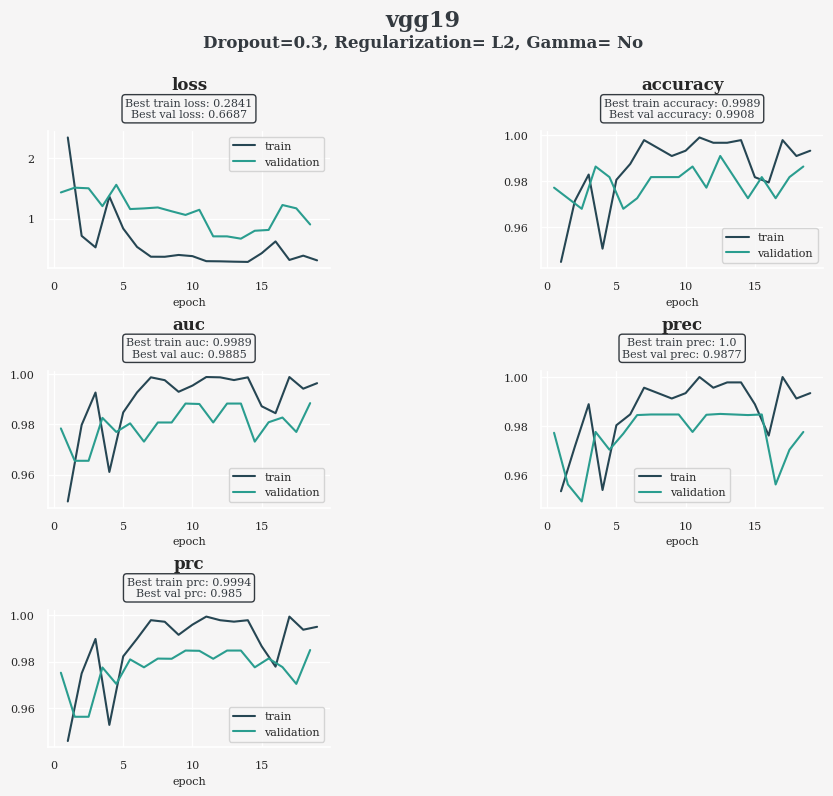

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



-----------------------------------
Classification Report
-----------------------------------
              precision    recall  f1-score   support

           0       1.00      0.97      0.98        87
           1       0.98      1.00      0.99       131

    accuracy                           0.99       218
   macro avg       0.99      0.98      0.99       218
weighted avg       0.99      0.99      0.99       218



<ipython-input-11-d6fc586719cd>:187: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + labels)
<ipython-input-11-d6fc586719cd>:188: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + labels)


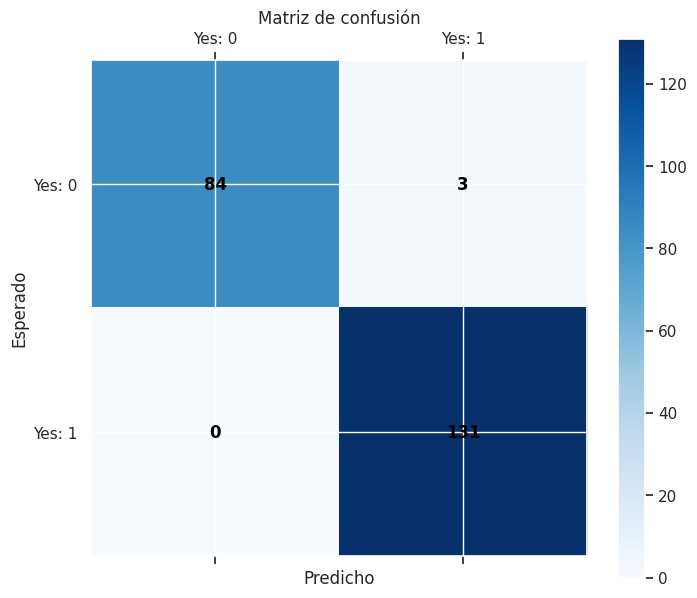


-----------------------------------
Eyes image prediction samples
-----------------------------------


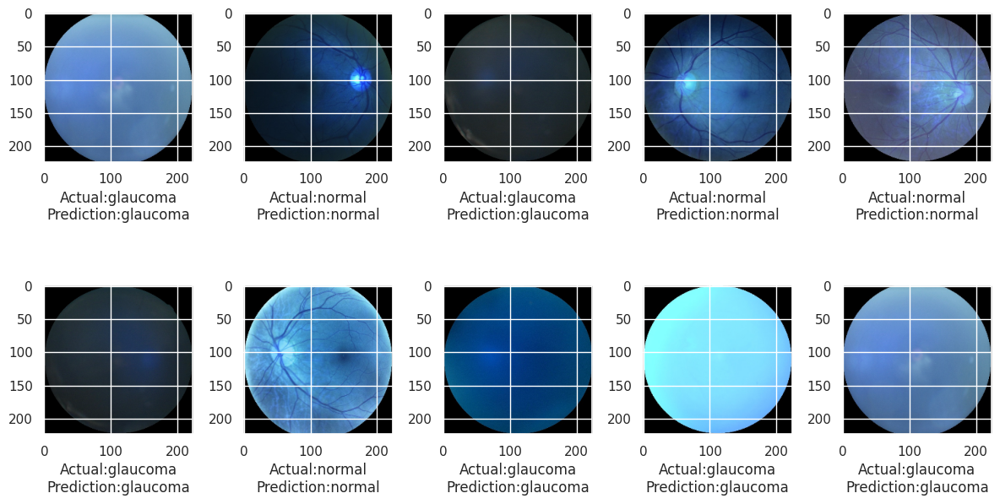

In [ ]:
print("---------------Creating the model for normal vs diabetes---------------\n")
history_16, model_16 = execute_model(dataset_cataract, "normal_vs_glaucoma", "vgg19", "normal", "glaucoma", True, 0.6)

### Referencias
# https://www.kaggle.com/code/ossingh6/cataract-detection-using-vgg19/notebook
# https://www.kaggle.com/code/abirhassanhridoy/reshypernet
# https://www.kaggle.com/code/ulafiliz/ocular-disease-detection-data-analysis
# https://www.kaggle.com/code/ingalevarad/cataract-prediction-using-inceptionv3
# https://www.kaggle.com/code/tikoboss/data-visualisation-ocular-disease-recognition